In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from collections import OrderedDict
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set style for professional visualizations
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12


In [2]:
site_mapping = OrderedDict([
    ("<PAD>", 0),
    ("QAID", 1), ("QAIG", 2), ("QASD", 3), ("QASG", 4),
    ("QLD", 5), ("QLG", 6), ("QPID", 7), ("QPIG", 8),
    ("QPSD", 9), ("QPSG", 10), ("APXD", 11), ("APXG", 12),
    ("QSLD", 13), ("QSLG", 14)
])

# Reverse mapping for visualization
site_names = {v: k for k, v in site_mapping.items()}

# Define pathologies
pathologies = ['a_lines', 'b_lines', 'small_consolidations', 
               'large_consolidations', 'pleural_effusion']

# Load data for all folds
def load_fold_data(fold_num):
    """Load train, val, and test data for a specific fold"""
    base_path = '/gpfs/gibbs/project/hartley/tjb76/artstuff_OPTIMIZEDWOOOO/ULTR-CLIP/results/'
    
    train_df = pd.read_csv(f'{base_path}train_full_model_fold{fold_num}_sites.csv')
    val_df = pd.read_csv(f'{base_path}val_full_model_fold{fold_num}_sites.csv')
    test_df = pd.read_csv(f'{base_path}test_full_model_fold{fold_num}_sites.csv')
    
    return train_df, val_df, test_df

# Initialize results storage
fold_results = {}
all_metrics = {}


fold_num = 2
train_df, val_df, test_df = load_fold_data(fold_num)
full_df = pd.concat([train_df, val_df, test_df], ignore_index=True)

print("Configuration Complete - Ready for Analysis")



Configuration Complete - Ready for Analysis


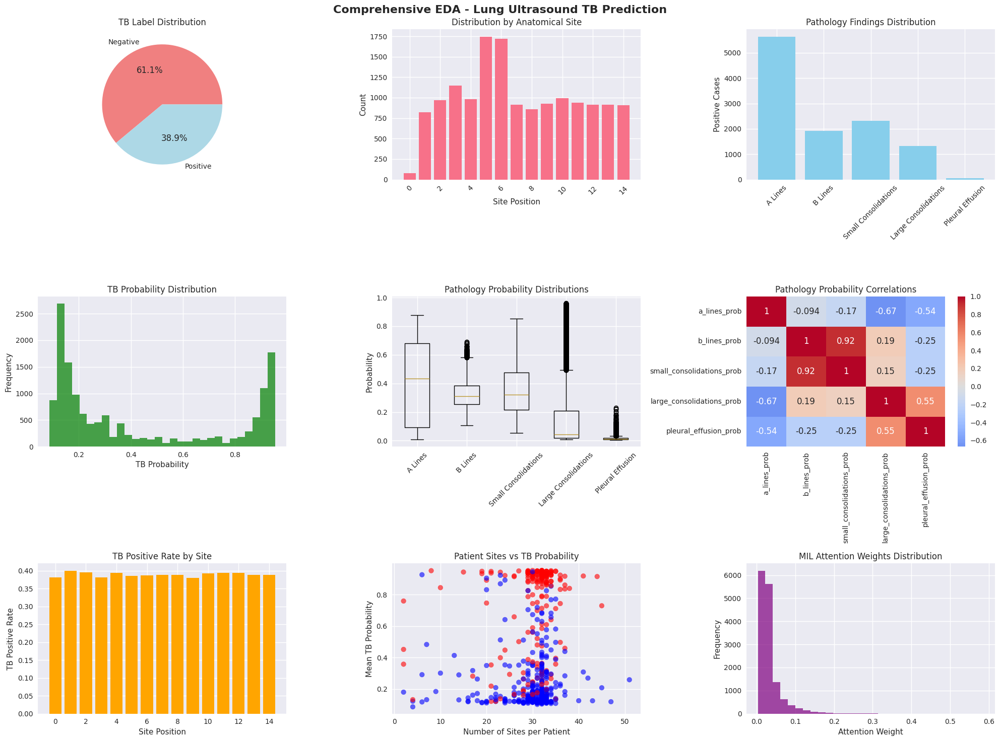


=== DATASET SUMMARY ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7


,batch_idx,patient_id,site_position,site_index,site_mask,tb_label,tb_logit,tb_prob,tb_pred,a_lines_finding,...,small_consolidations_logit,small_consolidations_prob,small_consolidations_pred,large_consolidations_logit,large_consolidations_prob,large_consolidations_pred,pleural_effusion_logit,pleural_effusion_prob,pleural_effusion_pred,mil_attention
0,0,25-334,0,7,True,1.0,2.885216,0.947111,1.0,0.0,...,0.043979,0.510993,1,-3.497623,0.029380,0,-4.817097,0.008025,0,0.005887
1,0,25-334,1,8,True,1.0,2.885216,0.947111,1.0,0.0,...,0.786024,0.686977,1,1.539688,0.823419,1,-4.040694,0.017281,0,0.035139
2,0,25-334,2,13,True,1.0,2.885216,0.947111,1.0,1.0,...,-0.340200,0.415761,0,-4.090445,0.016456,0,-4.954405,0.007003,0,0.005437
3,0,25-334,3,10,True,1.0,2.885216,0.947111,1.0,0.0,...,-1.091322,0.251369,0,3.137194,0.958401,1,-2.066005,0.112445,0,0.143125
4,0,25-334,4,6,True,1.0,2.885216,0.947111,1.0,0.0,...,-1.955700,0.123933,0,-2.717536,0.061946,0,-3.708057,0.023938,0,0.006086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14823,49,25-90,26,3,True,1.0,-1.541777,0.176277,0.0,0.0,...,0.201587,0.550227,1,-2.634180,0.066971,0,-4.708966,0.008934,0,0.034953
14824,49,25-90,27,4,True,1.0,-1.541777,0.176277,0.0,0.0,...,-0.790925,0.311970,0,-3.895322,0.019931,0,-4.818817,0.008012,0,0.022766
14825,49,25-90,28,5,True,1.0,-1.541777,0.176277,0.0,0.0,...,-0.288215,0.428441,0,-0.729583,0.325286,0,-4.309769,0.013259,0,0.044425
14826,49,25-90,29,5,True,1.0,-1.541777,0.176277,0.0,0.0,...,-1.062229,0.256884,0,-2.986638,0.048033,0,-4.459474,0.011436,0,0.022855


In [3]:
def comprehensive_eda(df_combined, title_suffix=""):
    """Perform comprehensive EDA on the combined dataset"""
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    fig.suptitle(f'Comprehensive EDA - Lung Ultrasound TB Prediction{title_suffix}', 
                 fontsize=16, fontweight='bold')
    
    # 1. TB Label Distribution
    tb_counts = df_combined['tb_label'].value_counts()
    axes[0,0].pie(tb_counts.values, labels=['Negative', 'Positive'], autopct='%1.1f%%',
                  colors=['lightcoral', 'lightblue'])
    axes[0,0].set_title('TB Label Distribution')
    
    # 2. Site Position Distribution
    site_counts = df_combined['site_index'].value_counts().sort_index()
    axes[0,1].bar(range(len(site_counts)), site_counts.values)
    axes[0,1].set_title('Distribution by Anatomical Site')
    axes[0,1].set_xlabel('Site Position')
    axes[0,1].set_ylabel('Count')
    axes[0,1].tick_params(axis='x', rotation=45)
    
    # 3. Pathology Findings Distribution
    pathology_counts = []
    pathology_labels = []
    for pathology in pathologies:
        if f'{pathology}_finding' in df_combined.columns:
            positive_count = df_combined[f'{pathology}_finding'].sum()
            pathology_counts.append(positive_count)
            pathology_labels.append(pathology.replace('_', ' ').title())
    
    axes[0,2].bar(pathology_labels, pathology_counts, color='skyblue')
    axes[0,2].set_title('Pathology Findings Distribution')
    axes[0,2].set_ylabel('Positive Cases')
    axes[0,2].tick_params(axis='x', rotation=45)
    
    # 4. TB Probability Distribution
    axes[1,0].hist(df_combined['tb_prob'], bins=30, alpha=0.7, color='green')
    axes[1,0].set_title('TB Probability Distribution')
    axes[1,0].set_xlabel('TB Probability')
    axes[1,0].set_ylabel('Frequency')
    
    # 5. Pathology Probabilities by TB Status
    pathology_probs = []
    for pathology in pathologies:
        if f'{pathology}_prob' in df_combined.columns:
            pathology_probs.append(df_combined[f'{pathology}_prob'])
    
    if pathology_probs:
        axes[1,1].boxplot(pathology_probs, labels=[p.replace('_', ' ').title() for p in pathologies])
        axes[1,1].set_title('Pathology Probability Distributions')
        axes[1,1].set_ylabel('Probability')
        axes[1,1].tick_params(axis='x', rotation=45)
    
    # 6. Correlation Matrix of Pathology Probabilities
    prob_cols = [f'{p}_prob' for p in pathologies if f'{p}_prob' in df_combined.columns]
    if prob_cols:
        corr_matrix = df_combined[prob_cols].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, ax=axes[1,2])
        axes[1,2].set_title('Pathology Probability Correlations')
    
    # 7. Site-wise TB Positive Rate
    site_tb_rate = df_combined.groupby('site_index')['tb_label'].mean()
    axes[2,0].bar(site_tb_rate.index, site_tb_rate.values, color='orange')
    axes[2,0].set_title('TB Positive Rate by Site')
    axes[2,0].set_xlabel('Site Position')
    axes[2,0].set_ylabel('TB Positive Rate')
    
    # 8. Patient-level Analysis
    patient_stats = df_combined.groupby('patient_id').agg({
        'tb_label': 'first',
        'site_index': 'count',
        'tb_prob': 'mean'
    }).rename(columns={'site_index': 'num_sites'})
    
    axes[2,1].scatter(patient_stats['num_sites'], patient_stats['tb_prob'], 
                      c=['red' if x == 1 else 'blue' for x in patient_stats['tb_label']],
                      alpha=0.6)
    axes[2,1].set_title('Patient Sites vs TB Probability')
    axes[2,1].set_xlabel('Number of Sites per Patient')
    axes[2,1].set_ylabel('Mean TB Probability')
    
    # 9. Attention Weights Distribution
    if 'mil_attention' in df_combined.columns:
        axes[2,2].hist(df_combined['mil_attention'], bins=30, alpha=0.7, color='purple')
        axes[2,2].set_title('MIL Attention Weights Distribution')
        axes[2,2].set_xlabel('Attention Weight')
        axes[2,2].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    # Summary Statistics
    print(f"\n=== DATASET SUMMARY{title_suffix} ===")
    print(f"Total samples: {len(df_combined)}")
    print(f"Unique patients: {df_combined['patient_id'].nunique()}")
    print(f"Unique sites: {df_combined['site_index'].nunique()}")
    print(f"TB positive rate: {df_combined['tb_label'].mean():.3f}")
    print(f"Mean sites per patient: {df_combined.groupby('patient_id').size().mean():.1f}")
    
    return df_combined


comprehensive_eda(full_df)

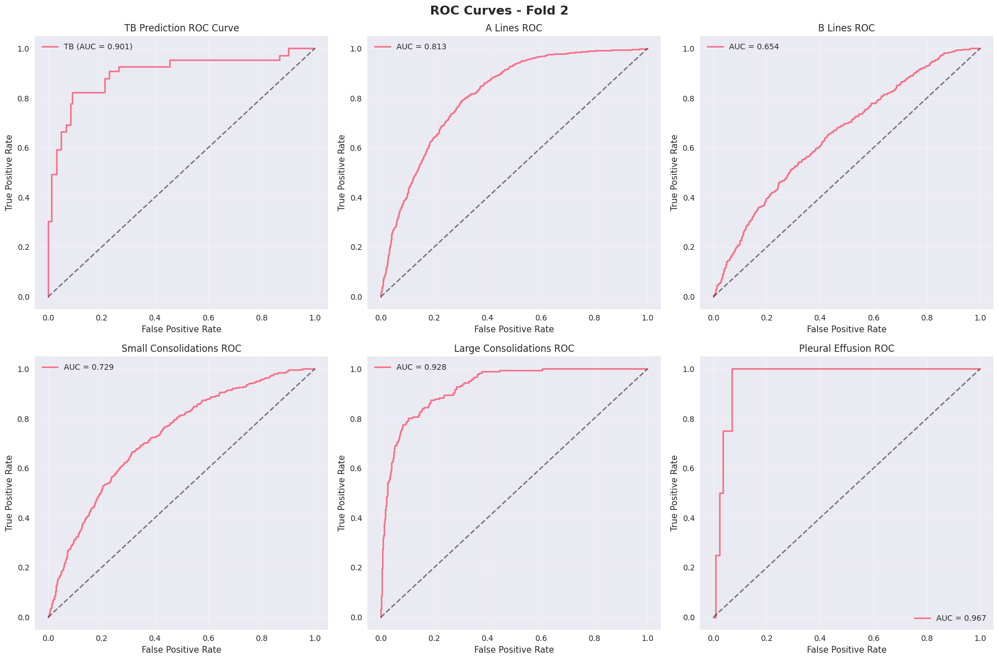

{'tb': {'accuracy': 0.8281461434370772,
  'auc_roc': 0.9013596438109471,
  'auc_pr': 0.8848224089930684,
  'sensitivity': 0.6920444824636441,
  'specificity': 0.9171796306659206,
  'ppv': 0.845350052246604,
  'npv': 0.8199099549774888},
 'pathologies': {'a_lines': {'accuracy': 0.7341001353179973,
   'auc_roc': 0.8133911971203739,
   'auc_pr': 0.7054774975818905,
   'sensitivity': 0.7128292268479184,
   'specificity': 0.7481731309724564,
   'ppv': 0.6519036519036518,
   'npv': 0.7974835230677052},
  'b_lines': {'accuracy': 0.8291610284167794,
   'auc_roc': 0.654299586158871,
   'auc_pr': 0.23509267565178216,
   'sensitivity': 0.14754098360655737,
   'specificity': 0.9442467378410438,
   'ppv': 0.3088235294117647,
   'npv': 0.8677325581395349},
  'small_consolidations': {'accuracy': 0.773680649526387,
   'auc_roc': 0.7288449358963386,
   'auc_pr': 0.319748158015535,
   'sensitivity': 0.43617021276595747,
   'specificity': 0.8374899436846339,
   'ppv': 0.3366174055829228,
   'npv': 0.8870

In [4]:
def analyze_model_performance(df, fold_num):
    """Analyze performance of current model predictions"""
    
    results = {}
    
    # TB Prediction Performance
    tb_metrics = calculate_metrics(df['tb_label'], df['tb_prob'], df['tb_pred'])
    results['tb'] = tb_metrics
    
    # Individual Pathology Performance
    pathology_results = {}
    for pathology in pathologies:
        if f'{pathology}_finding' in df.columns:
            y_true = df[f'{pathology}_finding']
            y_prob = df[f'{pathology}_prob']
            y_pred = df[f'{pathology}_pred']
            
            if y_true.sum() > 0:  # Only if there are positive cases
                pathology_results[pathology] = calculate_metrics(y_true, y_prob, y_pred)
    
    results['pathologies'] = pathology_results
    
    # Plot ROC Curves
    plot_roc_curves(df, fold_num)
    
    return results

def calculate_metrics(y_true, y_prob, y_pred):
    """Calculate comprehensive metrics"""
    metrics = {}
    
    # Basic metrics
    metrics['accuracy'] = accuracy_score(y_true, y_pred)
    metrics['auc_roc'] = roc_auc_score(y_true, y_prob)
    
    # Precision-Recall
    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    metrics['auc_pr'] = auc(recall, precision)
    
    # Confusion Matrix derived metrics
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    metrics['sensitivity'] = tp / (tp + fn) if (tp + fn) > 0 else 0
    metrics['specificity'] = tn / (tn + fp) if (tn + fp) > 0 else 0
    metrics['ppv'] = tp / (tp + fp) if (tp + fp) > 0 else 0
    metrics['npv'] = tn / (tn + fn) if (tn + fn) > 0 else 0
    
    return metrics

def plot_roc_curves(df, fold_num):
    """Plot ROC curves for TB and pathology predictions"""
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'ROC Curves - Fold {fold_num}', fontsize=16, fontweight='bold')
    
    # TB ROC Curve
    fpr, tpr, _ = roc_curve(df['tb_label'], df['tb_prob'])
    auc_score = roc_auc_score(df['tb_label'], df['tb_prob'])
    
    axes[0,0].plot(fpr, tpr, label=f'TB (AUC = {auc_score:.3f})', linewidth=2)
    axes[0,0].plot([0, 1], [0, 1], 'k--', alpha=0.5)
    axes[0,0].set_xlabel('False Positive Rate')
    axes[0,0].set_ylabel('True Positive Rate')
    axes[0,0].set_title('TB Prediction ROC Curve')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)
    
    # Pathology ROC Curves
    plot_idx = 1
    for pathology in pathologies:
        if f'{pathology}_finding' in df.columns and plot_idx < 6:
            y_true = df[f'{pathology}_finding']
            y_prob = df[f'{pathology}_prob']
            
            if y_true.sum() > 0:
                fpr, tpr, _ = roc_curve(y_true, y_prob)
                auc_score = roc_auc_score(y_true, y_prob)
                
                row, col = divmod(plot_idx, 3)
                axes[row, col].plot(fpr, tpr, label=f'AUC = {auc_score:.3f}', linewidth=2)
                axes[row, col].plot([0, 1], [0, 1], 'k--', alpha=0.5)
                axes[row, col].set_xlabel('False Positive Rate')
                axes[row, col].set_ylabel('True Positive Rate')
                axes[row, col].set_title(f'{pathology.replace("_", " ").title()} ROC')
                axes[row, col].legend()
                axes[row, col].grid(True, alpha=0.3)
            
            plot_idx += 1
    
    # Hide unused subplots
    for i in range(plot_idx, 6):
        row, col = divmod(i, 3)
        axes[row, col].set_visible(False)
    
    plt.tight_layout()
    plt.show()



analyze_model_performance(test_df, fold_num)

Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...

Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


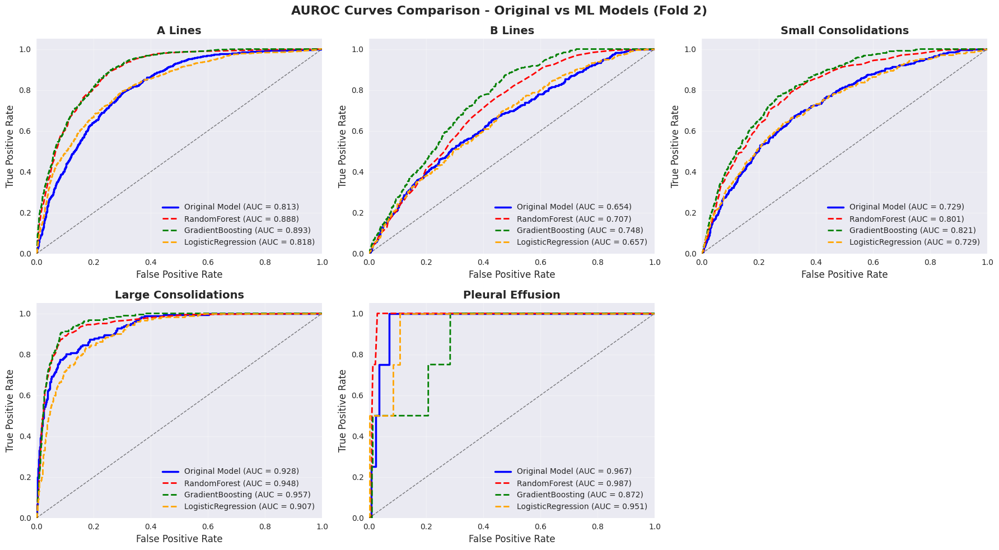


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 2

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.813
RandomForest AUC: 0.888
GradientBoosting AUC: 0.893
LogisticRegression AUC: 0.818
🏆 Best ML Model: GradientBoosting (AUC = 0.893)
Improvement: +0.079

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.654
RandomForest AUC: 0.707
GradientBoosting AUC: 0.748
LogisticRegression AUC: 0.657
🏆 Best ML Model: GradientBoosting (AUC = 0.748)
Improvement: +0.094

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.729
RandomForest AUC: 0.801
GradientBoosting AUC: 0.821
LogisticRegression AUC: 0.729
🏆 Best ML Model: GradientBoosting (AUC = 0.821)
Improvement: +0.092

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.928
RandomForest AUC: 0.948
GradientBoosting AUC: 0.957
Logistic

{'a_lines': {'RandomForest': {'metrics': {'accuracy': 0.8068335588633289,
    'auc_roc': 0.8879175675049656,
    'auc_pr': 0.8067040199696364,
    'sensitivity': 0.762107051826678,
    'specificity': 0.836424957841484,
    'ppv': 0.7550505050505051,
    'npv': 0.8416289592760181},
   'predictions': array([0.16, 0.84, 0.17, ..., 0.03, 0.01, 0.65]),
   'model': RandomForestClassifier(random_state=42),
   'scaler': None},
  'GradientBoosting': {'metrics': {'accuracy': 0.8017591339648173,
    'auc_roc': 0.892693622327513,
    'auc_pr': 0.8213756156890051,
    'sensitivity': 0.7714528462192014,
    'specificity': 0.8218100056211355,
    'ppv': 0.7412244897959184,
    'npv': 0.8445984979780474},
   'predictions': array([0.14665503, 0.80953998, 0.54647875, ..., 0.02646377, 0.03342279,
          0.68857875]),
   'model': GradientBoostingClassifier(random_state=42),
   'scaler': None},
  'LogisticRegression': {'metrics': {'accuracy': 0.7493234100135318,
    'auc_roc': 0.8176951625281832,
    'a

In [26]:
def plot_pathology_auroc_comparison(test_df, pathology_results, fold_num):
    """Plot AUROC curves comparing original vs ML models for each pathology"""
    
    # Count pathologies with positive cases
    valid_pathologies = []
    for pathology in pathologies:
        target_col = f'{pathology}_finding'
        if target_col in test_df.columns and test_df[target_col].sum() > 0:
            valid_pathologies.append(pathology)
    
    if not valid_pathologies:
        print("No pathologies with positive cases found for AUROC plotting")
        return
    
    # Calculate subplot layout
    n_pathologies = len(valid_pathologies)
    cols = min(3, n_pathologies)
    rows = (n_pathologies + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 5*rows))
    fig.suptitle(f'AUROC Curves Comparison - Original vs ML Models (Fold {fold_num})', 
                 fontsize=16, fontweight='bold')
    
    # Ensure axes is always a list for consistent indexing
    if n_pathologies == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes
    else:
        axes = axes.flatten()
    
    colors = ['blue', 'red', 'green', 'orange', 'purple']
    
    for idx, pathology in enumerate(valid_pathologies):
        ax = axes[idx]
        target_col = f'{pathology}_finding'
        original_prob_col = f'{pathology}_prob'
        
        y_true = test_df[target_col]
        
        # Plot original model AUROC
        if original_prob_col in test_df.columns:
            y_original_prob = test_df[original_prob_col]
            fpr_orig, tpr_orig, _ = roc_curve(y_true, y_original_prob)
            auc_orig = roc_auc_score(y_true, y_original_prob)
            
            ax.plot(fpr_orig, tpr_orig, color=colors[0], linewidth=2.5, 
                   label=f'Original Model (AUC = {auc_orig:.3f})')
        
        # Plot ML models AUROC
        if pathology in pathology_results:
            color_idx = 1
            for model_name, model_data in pathology_results[pathology].items():
                if 'predictions' in model_data:
                    y_ml_prob = model_data['predictions']
                    fpr_ml, tpr_ml, _ = roc_curve(y_true, y_ml_prob)
                    auc_ml = roc_auc_score(y_true, y_ml_prob)
                    
                    ax.plot(fpr_ml, tpr_ml, color=colors[color_idx % len(colors)], 
                           linewidth=2, linestyle='--', 
                           label=f'{model_name} (AUC = {auc_ml:.3f})')
                    color_idx += 1
        
        # Plot diagonal line
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.5, linewidth=1)
        
        # Formatting
        ax.set_xlabel('False Positive Rate', fontsize=12)
        ax.set_ylabel('True Positive Rate', fontsize=12)
        ax.set_title(f'{pathology.replace("_", " ").title()}', fontsize=14, fontweight='bold')
        ax.legend(loc='lower right', fontsize=10)
        ax.grid(True, alpha=0.3)
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
    
    # Hide unused subplots
    for idx in range(n_pathologies, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    # Print performance comparison summary
    print(f"\n📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold {fold_num}")
    print("="*60)
    
    for pathology in valid_pathologies:
        target_col = f'{pathology}_finding'
        original_prob_col = f'{pathology}_prob'
        
        print(f"\n🔬 {pathology.replace('_', ' ').title()}:")
        print("-" * 30)
        
        y_true = test_df[target_col]
        positive_cases = y_true.sum()
        print(f"Positive cases: {positive_cases}/{len(y_true)} ({positive_cases/len(y_true)*100:.1f}%)")
        
        # Original model performance
        if original_prob_col in test_df.columns:
            y_original_prob = test_df[original_prob_col]
            auc_orig = roc_auc_score(y_true, y_original_prob)
            print(f"Original Model AUC: {auc_orig:.3f}")
        
        # ML models performance
        if pathology in pathology_results:
            best_model = None
            best_auc = 0
            
            for model_name, model_data in pathology_results[pathology].items():
                if 'metrics' in model_data:
                    auc_ml = model_data['metrics']['auc_roc']
                    print(f"{model_name} AUC: {auc_ml:.3f}")
                    
                    if auc_ml > best_auc:
                        best_auc = auc_ml
                        best_model = model_name
            
            if best_model:
                improvement = best_auc - auc_orig if original_prob_col in test_df.columns else 0
                print(f"🏆 Best ML Model: {best_model} (AUC = {best_auc:.3f})")
                if original_prob_col in test_df.columns:
                    print(f"Improvement: {improvement:+.3f}")

def train_pathology_models(train_df, val_df, test_df, fold_num):
    """Train ML models to predict individual pathologies"""
    
    results = {}
    
    # Combine train and validation for training
    train_combined = pd.concat([train_df, val_df], ignore_index=True)
    
    # Feature columns (probabilities from other pathologies + site info)
    feature_cols = []
    for pathology in pathologies:
        feature_cols.extend([f'{pathology}_prob'])
    feature_cols.extend(['site_index', 'mil_attention'])  # Changed from site_index to site_position
    
    # Filter existing columns
    available_features = [col for col in feature_cols if col in train_combined.columns]
    
    print(f"Training pathology models with features: {available_features}")
    
    # Train model for each pathology
    for target_pathology in pathologies:
        target_col = f'{target_pathology}_finding'
        
        if target_col not in train_combined.columns:
            continue
            
        # Skip if no positive cases
        if train_combined[target_col].sum() == 0:
            print(f"Skipping {target_pathology} - no positive cases")
            continue
            
        print(f"\nTraining model for {target_pathology}...")
        
        # Prepare features (exclude target pathology's own features to avoid data leakage)
        model_features = [col for col in available_features 
                         if not col.startswith(target_pathology)]
        
        X_train = train_combined[model_features].fillna(0)
        y_train = train_combined[target_col]
        
        X_test = test_df[model_features].fillna(0)
        y_test = test_df[target_col]
        
        # Train multiple models
        models = {
            'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
            'GradientBoosting': GradientBoostingClassifier(random_state=42),
            'LogisticRegression': LogisticRegression(random_state=42, max_iter=1000)
        }
        
        pathology_results = {}
        
        for model_name, model in models.items():
            # Scale features for LogisticRegression
            if model_name == 'LogisticRegression':
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)
                model.fit(X_train_scaled, y_train)
                y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
                y_pred = model.predict(X_test_scaled)
            else:
                model.fit(X_train, y_train)
                y_pred_proba = model.predict_proba(X_test)[:, 1]
                y_pred = model.predict(X_test)
            
            # Calculate metrics
            if y_test.sum() > 0:
                metrics = calculate_metrics(y_test, y_pred_proba, y_pred)
                pathology_results[model_name] = {
                    'metrics': metrics,
                    'predictions': y_pred_proba,
                    'model': model,
                    'scaler': scaler if model_name == 'LogisticRegression' else None
                }
        
        results[target_pathology] = pathology_results
    
    # Plot AUROC comparison for all pathologies
    print(f"\nGenerating AUROC comparison plots...")
    plot_pathology_auroc_comparison(test_df, results, fold_num)
    
    return results

def create_pathology_performance_summary(all_fold_results):
    """Create comprehensive summary of pathology model performance across folds"""
    
    print("\n" + "="*80)
    print("PATHOLOGY MODEL PERFORMANCE ACROSS ALL FOLDS")
    print("="*80)
    
    # Collect results across folds
    pathology_performance = {}
    
    for fold_num, fold_results in all_fold_results.items():
        if 'pathology_models' not in fold_results:
            continue
            
        pathology_models = fold_results['pathology_models']
        
        for pathology, models in pathology_models.items():
            if pathology not in pathology_performance:
                pathology_performance[pathology] = {}
            
            for model_name, model_data in models.items():
                if model_name not in pathology_performance[pathology]:
                    pathology_performance[pathology][model_name] = []
                
                if 'metrics' in model_data:
                    pathology_performance[pathology][model_name].append(
                        model_data['metrics']['auc_roc']
                    )
    
    if not pathology_performance:
        print("No pathology model results found")
        return None
    
    # Create comprehensive comparison plot
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Pathology Model Performance Summary - All Folds', 
                 fontsize=16, fontweight='bold')
    axes = axes.flatten()
    
    pathology_names = list(pathology_performance.keys())
    
    for idx, pathology in enumerate(pathology_names[:6]):  # Limit to 6 pathologies
        ax = axes[idx]
        
        models_data = pathology_performance[pathology]
        model_names = list(models_data.keys())
        
        # Prepare data for boxplot
        box_data = []
        labels = []
        
        for model_name in model_names:
            if models_data[model_name]:  # If we have data for this model
                box_data.append(models_data[model_name])
                labels.append(model_name)
        
        if box_data:
            bp = ax.boxplot(box_data, labels=labels, patch_artist=True, 
                           notch=True, showmeans=True)
            
            # Color the boxes
            colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightyellow']
            for patch, color in zip(bp['boxes'], colors):
                patch.set_facecolor(color)
            
            ax.set_title(f'{pathology.replace("_", " ").title()}', fontweight='bold')
            ax.set_ylabel('AUC-ROC')
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='x', rotation=45)
            
            # Add mean values as text
            for i, model_name in enumerate(labels):
                mean_val = np.mean(box_data[i])
                ax.text(i+1, mean_val + 0.02, f'{mean_val:.3f}', 
                       ha='center', va='bottom', fontweight='bold')
    
    # Hide unused subplots
    for idx in range(len(pathology_names), 6):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    # Print numerical summary
    print("\n📊 NUMERICAL SUMMARY:")
    print("-" * 60)
    
    for pathology, models_data in pathology_performance.items():
        print(f"\n🔬 {pathology.replace('_', ' ').title()}:")
        print("-" * 30)
        
        for model_name, auc_values in models_data.items():
            if auc_values:
                mean_auc = np.mean(auc_values)
                std_auc = np.std(auc_values)
                n_folds = len(auc_values)
                
                # 95% CI
                t_score = stats.t.ppf(0.975, n_folds-1)
                margin = t_score * std_auc / np.sqrt(n_folds)
                
                print(f"{model_name:15}: {mean_auc:.3f} ± {std_auc:.3f} "
                      f"[{mean_auc-margin:.3f}, {mean_auc+margin:.3f}] (n={n_folds})")
    
    return pathology_performance


train_pathology_models(train_df, val_df, test_df, fold_num)

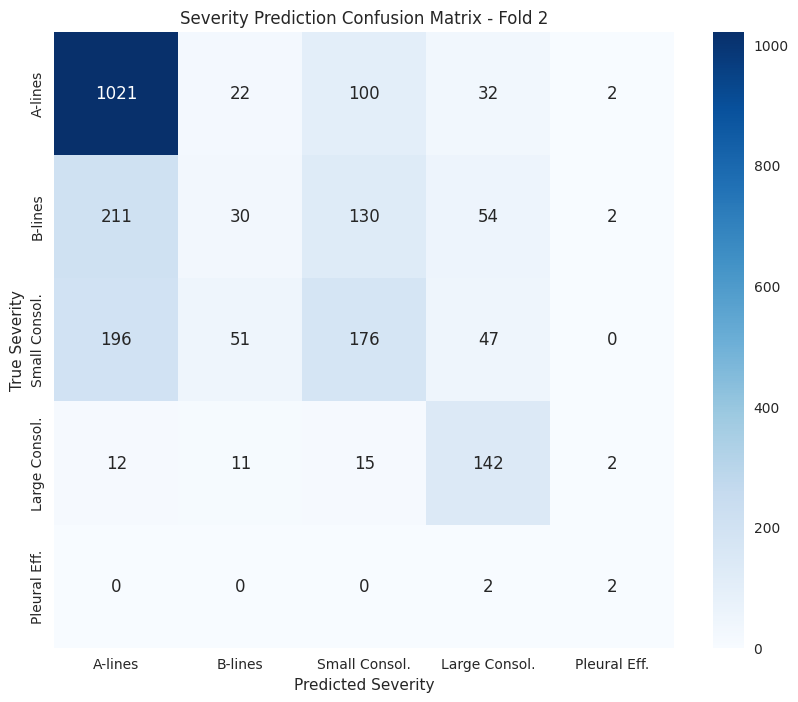

{'model': RandomForestClassifier(random_state=42),
 'accuracy': 0.606637168141593,
 'confusion_matrix': array([[1021,   22,  100,   32,    2],
        [ 211,   30,  130,   54,    2],
        [ 196,   51,  176,   47,    0],
        [  12,   11,   15,  142,    2],
        [   0,    0,    0,    2,    2]]),
 'predictions': array([3, 0, 0, ..., 2, 0, 0]),
 'probabilities': array([[0.11, 0.13, 0.09, 0.64, 0.03],
        [0.73, 0.2 , 0.07, 0.  , 0.  ],
        [0.58, 0.23, 0.18, 0.01, 0.  ],
        ...,
        [0.33, 0.3 , 0.36, 0.01, 0.  ],
        [0.69, 0.21, 0.1 , 0.  , 0.  ],
        [0.91, 0.08, 0.01, 0.  , 0.  ]]),
 'true_labels': array([2, 0, 0, ..., 2, 2, 2])}

In [7]:
def create_severity_labels(df):
    """Create severity labels based on pathology findings (one-hot encoded)"""
    
    # Define severity mapping
    severity_mapping = {
        'a_lines_finding': 0,
        'b_lines_finding': 1,
        'small_consolidations_finding': 2,
        'large_consolidations_finding': 3,
        'pleural_effusion_finding': 4
    }
    
    # Create severity labels
    severity_labels = []
    
    for _, row in df.iterrows():
        severity = -1  # Default for no finding
        
        for pathology, severity_level in severity_mapping.items():
            if pathology in df.columns and row[pathology] == 1:
                severity = severity_level
                break
        
        severity_labels.append(severity)
    
    return np.array(severity_labels)

def train_severity_model(train_df, val_df, test_df, fold_num):
    """Train model to predict severity based on pathology probabilities"""
    
    # Create severity labels
    train_combined = pd.concat([train_df, val_df], ignore_index=True)
    
    y_train = create_severity_labels(train_combined)
    y_test = create_severity_labels(test_df)
    
    # Remove samples with no findings (severity = -1)
    train_mask = y_train != -1
    test_mask = y_test != -1
    
    if train_mask.sum() == 0 or test_mask.sum() == 0:
        print("No positive cases found for severity prediction")
        return None
    
    # Prepare features
    feature_cols = [f'{p}_prob' for p in pathologies if f'{p}_prob' in train_combined.columns]
    feature_cols.extend(['site_index', 'mil_attention'])
    available_features = [col for col in feature_cols if col in train_combined.columns]
    
    X_train = train_combined.loc[train_mask, available_features].fillna(0)
    y_train_filtered = y_train[train_mask]
    
    X_test = test_df.loc[test_mask, available_features].fillna(0)
    y_test_filtered = y_test[test_mask]
    
    # Train model
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train_filtered)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test_filtered, y_pred)
    
    # Confusion matrix
    cm = confusion_matrix(y_test_filtered, y_pred)
    
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['A-lines', 'B-lines', 'Small Consol.', 'Large Consol.', 'Pleural Eff.'],
                yticklabels=['A-lines', 'B-lines', 'Small Consol.', 'Large Consol.', 'Pleural Eff.'])
    plt.title(f'Severity Prediction Confusion Matrix - Fold {fold_num}')
    plt.xlabel('Predicted Severity')
    plt.ylabel('True Severity')
    plt.show()
    
    return {
        'model': model,
        'accuracy': accuracy,
        'confusion_matrix': cm,
        'predictions': y_pred,
        'probabilities': y_pred_proba,
        'true_labels': y_test_filtered
    }

train_severity_model(train_df, val_df, test_df, fold_num)

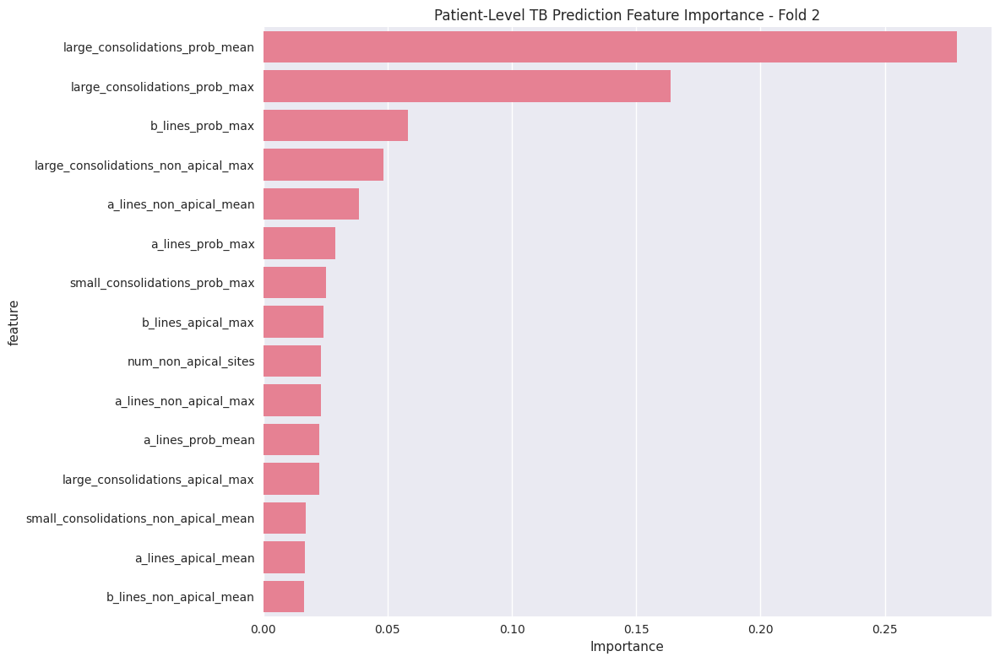

In [11]:
def aggregate_patient_level(df):
    """Aggregate predictions at patient level with apical/non-apical grouping"""
    
    apical_sites = [11, 12, 7, 8]  #
   
    
    patient_aggregated = []
    
    for patient_id in df['patient_id'].unique():
        patient_data = df[df['patient_id'] == patient_id]
        
        # Separate apical and non-apical
        apical_data = patient_data[patient_data['site_index'].isin(apical_sites)]
        non_apical_data = patient_data[~patient_data['site_index'].isin(apical_sites)]
        
        # Aggregate features
        patient_features = {
            'patient_id': patient_id,
            'tb_label': patient_data['tb_label'].iloc[0],  # Same for all sites
            'tb_prob_max': patient_data['tb_prob'].max(),
            'tb_prob_mean': patient_data['tb_prob'].mean(),
            'num_sites': len(patient_data),
            'num_apical_sites': len(apical_data),
            'num_non_apical_sites': len(non_apical_data)
        }
        
        # Pathology aggregations
        for pathology in pathologies:
            if f'{pathology}_prob' in df.columns:
                # Overall
                patient_features[f'{pathology}_prob_max'] = patient_data[f'{pathology}_prob'].max()
                patient_features[f'{pathology}_prob_mean'] = patient_data[f'{pathology}_prob'].mean()
                
                # Apical
                if len(apical_data) > 0:
                    patient_features[f'{pathology}_apical_max'] = apical_data[f'{pathology}_prob'].max()
                    patient_features[f'{pathology}_apical_mean'] = apical_data[f'{pathology}_prob'].mean()
                else:
                    patient_features[f'{pathology}_apical_max'] = 0
                    patient_features[f'{pathology}_apical_mean'] = 0
                
                # Non-apical
                if len(non_apical_data) > 0:
                    patient_features[f'{pathology}_non_apical_max'] = non_apical_data[f'{pathology}_prob'].max()
                    patient_features[f'{pathology}_non_apical_mean'] = non_apical_data[f'{pathology}_prob'].mean()
                else:
                    patient_features[f'{pathology}_non_apical_max'] = 0
                    patient_features[f'{pathology}_non_apical_mean'] = 0
        
        patient_aggregated.append(patient_features)
    
    return pd.DataFrame(patient_aggregated)


def train_patient_level_tb_model(train_df, val_df, test_df, fold_num):
    """Train TB prediction model at patient level"""
    
    # Aggregate data
    train_agg = aggregate_patient_level(pd.concat([train_df, val_df], ignore_index=True))
    test_agg = aggregate_patient_level(test_df)
    
    # Feature selection
    feature_cols = [col for col in train_agg.columns 
                   if col not in ['patient_id', 'tb_label'] and not col.startswith('tb_')]
    
    X_train = train_agg[feature_cols].fillna(0)
    y_train = train_agg['tb_label']
    
    
    X_test = test_agg[feature_cols].fillna(0)
    y_test = test_agg['tb_label']
    
    # Train model
    model = GradientBoostingClassifier(random_state=42)
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    metrics = calculate_metrics(y_test, y_pred_proba, y_pred)
    
    # Feature importance
    feature_importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=False)
    
    # Plot feature importance
    plt.figure(figsize=(12, 8))
    sns.barplot(data=feature_importance.head(15), x='importance', y='feature')
    plt.title(f'Patient-Level TB Prediction Feature Importance - Fold {fold_num}')
    plt.xlabel('Importance')
    plt.tight_layout()
    plt.show()
    
    return {
        'model': model,
        'metrics': metrics,
        'predictions': y_pred_proba,
        'feature_importance': feature_importance,
        'test_agg': test_agg
    }


results = train_patient_level_tb_model(train_df, val_df, test_df, fold_num)


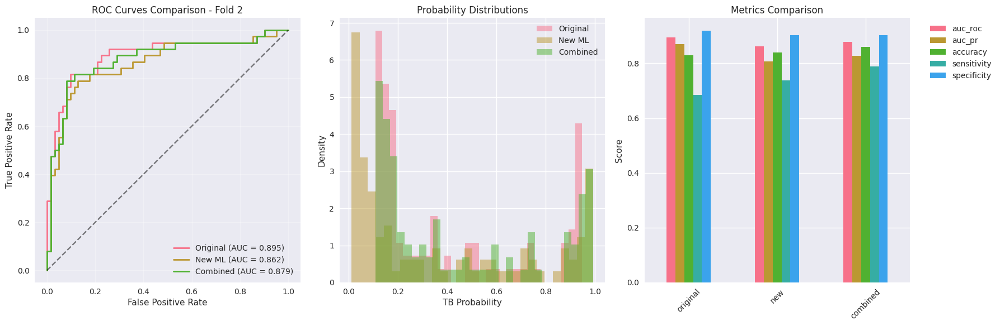

{'original': {'accuracy': 0.83,
  'auc_roc': 0.8947368421052633,
  'auc_pr': 0.8707109831187265,
  'sensitivity': 0.6842105263157895,
  'specificity': 0.9193548387096774,
  'ppv': 0.8387096774193549,
  'npv': 0.8260869565217391},
 'new': {'accuracy': 0.84,
  'auc_roc': 0.8620543293718167,
  'auc_pr': 0.8070286391760425,
  'sensitivity': 0.7368421052631579,
  'specificity': 0.9032258064516129,
  'ppv': 0.8235294117647058,
  'npv': 0.8484848484848485},
 'combined': {'accuracy': 0.86,
  'auc_roc': 0.8786078098471987,
  'auc_pr': 0.8267274906589294,
  'sensitivity': 0.7894736842105263,
  'specificity': 0.9032258064516129,
  'ppv': 0.8333333333333334,
  'npv': 0.875}}

In [20]:
def combined_prediction_analysis(original_tb_prob, new_tb_prob, tb_labels, fold_num):
    """Analyze combined approach using max of original and new predictions"""
    
    # Combined predictions
    combined_prob = np.maximum(original_tb_prob, new_tb_prob)
    combined_pred = (combined_prob > 0.5).astype(int)
    
    # Calculate metrics for all approaches
    results = {}
    
    # Original model
    original_pred = (original_tb_prob > 0.5).astype(int)
    results['original'] = calculate_metrics(tb_labels, original_tb_prob, original_pred)
    
    # New model
    new_pred = (new_tb_prob > 0.5).astype(int)
    results['new'] = calculate_metrics(tb_labels, new_tb_prob, new_pred)
    
    # Combined model
    results['combined'] = calculate_metrics(tb_labels, combined_prob, combined_pred)
    
    # Plot comparison
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # ROC Curves
    for i, (name, probs) in enumerate([('Original', original_tb_prob), 
                                      ('New ML', new_tb_prob), 
                                      ('Combined', combined_prob)]):
        fpr, tpr, _ = roc_curve(tb_labels, probs)
        auc_score = roc_auc_score(tb_labels, probs)
        axes[0].plot(fpr, tpr, label=f'{name} (AUC = {auc_score:.3f})', linewidth=2)
    
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.5)
    axes[0].set_xlabel('False Positive Rate')
    axes[0].set_ylabel('True Positive Rate')
    axes[0].set_title(f'ROC Curves Comparison - Fold {fold_num}')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Probability distributions
    axes[1].hist(original_tb_prob, bins=30, alpha=0.5, label='Original', density=True)
    axes[1].hist(new_tb_prob, bins=30, alpha=0.5, label='New ML', density=True)
    axes[1].hist(combined_prob, bins=30, alpha=0.5, label='Combined', density=True)
    axes[1].set_xlabel('TB Probability')
    axes[1].set_ylabel('Density')
    axes[1].set_title('Probability Distributions')
    axes[1].legend()
    
    # Metrics comparison
    metrics_df = pd.DataFrame(results).T
    metrics_df[['auc_roc', 'auc_pr', 'accuracy', 'sensitivity', 'specificity']].plot(
        kind='bar', ax=axes[2])
    axes[2].set_title('Metrics Comparison')
    axes[2].set_ylabel('Score')
    axes[2].tick_params(axis='x', rotation=45)
    axes[2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()
    
    return results

combined_prediction_analysis(results['test_agg']['tb_prob_max'], results['predictions'], results['test_agg']['tb_label'], fold_num)


Analyzing MIL Attention Patterns - Fold 2


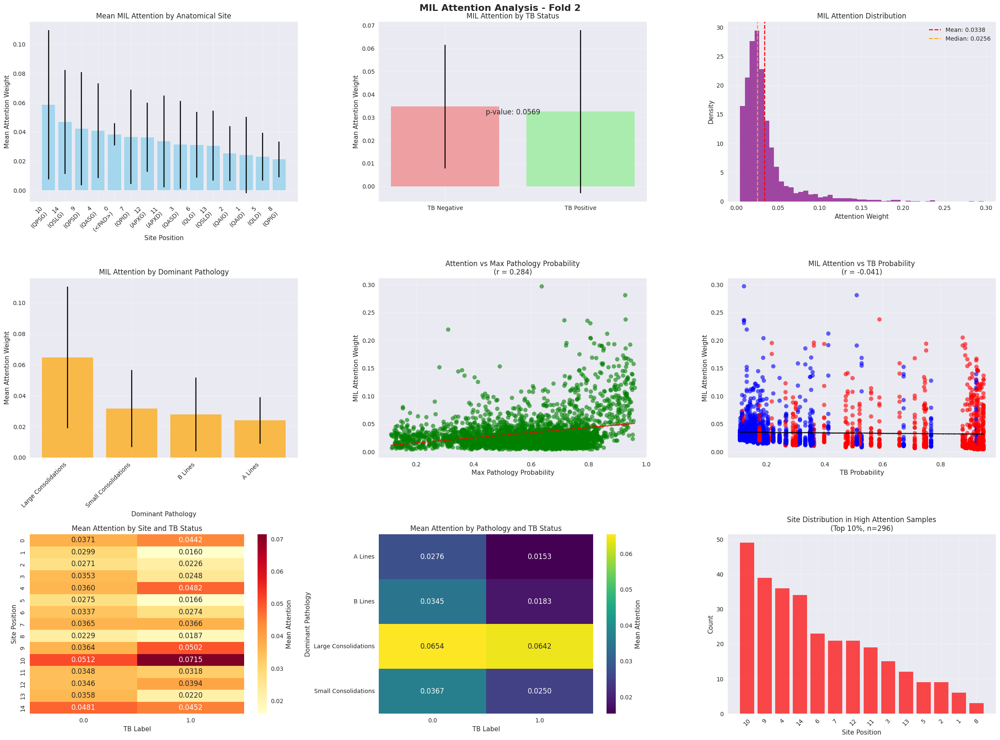


🔍 KEY ATTENTION FINDINGS - Fold 2:
----------------------------------------
• Overall attention mean: 0.0338
• TB correlation with attention: -0.0411
• TB+ vs TB- attention difference: p=0.0569 ns
• Highest attention site: 10 (QPSG) - 0.0587
• Highest attention pathology: large_consolidations - 0.0647


{'overall_stats': {'mean': 0.03382949959326036,
  'std': 0.030561569408934935,
  'median': 0.02560427784919735,
  'q75': 0.0375915206968784,
  'q90': 0.06508886441588399},
 'site_attention': [{'site_index': 10,
   'mean': 0.058660203160965124,
   'std': 0.051024301896269754,
   'count': 196,
   'site_name': 'QPSG'},
  {'site_index': 14,
   'mean': 0.04692535120783379,
   'std': 0.035568567853560364,
   'count': 177,
   'site_name': 'QSLG'},
  {'site_index': 9,
   'mean': 0.042176673446970084,
   'std': 0.03870949512000487,
   'count': 193,
   'site_name': 'QPSD'},
  {'site_index': 4,
   'mean': 0.040843899083352536,
   'std': 0.032438297914649306,
   'count': 194,
   'site_name': 'QASG'},
  {'site_index': 0,
   'mean': 0.03836927342821248,
   'std': 0.007502567758859514,
   'count': 11,
   'site_name': '<PAD>'},
  {'site_index': 7,
   'mean': 0.03656419133767481,
   'std': 0.032257212730691404,
   'count': 175,
   'site_name': 'QPID'},
  {'site_index': 12,
   'mean': 0.0363664283809032

In [22]:
def analyze_mil_attention(df, fold_num):
    """Comprehensive analysis of MIL attention weights by site and pathology"""
    
    if 'mil_attention' not in df.columns:
        print("MIL attention data not available")
        return None
    
    print(f"\nAnalyzing MIL Attention Patterns - Fold {fold_num}")
    print("="*50)
    
    # Create comprehensive figure
    fig, axes = plt.subplots(3, 3, figsize=(24, 18))
    fig.suptitle(f'MIL Attention Analysis - Fold {fold_num}', fontsize=16, fontweight='bold')
    
    # 1. Attention by Site Position
    site_attention = df.groupby('site_index')['mil_attention'].agg(['mean', 'std', 'count'])
    site_attention = site_attention.reset_index()
    site_attention['site_name'] = site_attention['site_index'].map(site_names)
    site_attention = site_attention.sort_values('mean', ascending=False)
    
    axes[0,0].bar(range(len(site_attention)), site_attention['mean'], 
                  yerr=site_attention['std'], capsize=5, alpha=0.7, color='skyblue')
    axes[0,0].set_title('Mean MIL Attention by Anatomical Site')
    axes[0,0].set_xlabel('Site Position')
    axes[0,0].set_ylabel('Mean Attention Weight')
    axes[0,0].set_xticks(range(len(site_attention)))
    axes[0,0].set_xticklabels([f"{row['site_index']}\n({row['site_name']})" 
                               for _, row in site_attention.iterrows()], 
                              rotation=45, ha='right')
    axes[0,0].grid(True, alpha=0.3)
    
    # 2. Attention by TB Status
    tb_attention = df.groupby('tb_label')['mil_attention'].agg(['mean', 'std', 'count'])
    
    axes[0,1].bar(['TB Negative', 'TB Positive'], tb_attention['mean'], 
                  yerr=tb_attention['std'], capsize=5, alpha=0.7, 
                  color=['lightcoral', 'lightgreen'])
    axes[0,1].set_title('MIL Attention by TB Status')
    axes[0,1].set_ylabel('Mean Attention Weight')
    axes[0,1].grid(True, alpha=0.3)
    
    # Statistical test for attention difference by TB status
    tb_neg_attention = df[df['tb_label'] == 0]['mil_attention']
    tb_pos_attention = df[df['tb_label'] == 1]['mil_attention']
    
    if len(tb_neg_attention) > 0 and len(tb_pos_attention) > 0:
        t_stat, p_value = stats.ttest_ind(tb_neg_attention, tb_pos_attention)
        axes[0,1].text(0.5, max(tb_attention['mean']) * 0.9, 
                       f'p-value: {p_value:.4f}', 
                       ha='center', transform=axes[0,1].transData)
    
    # 3. Attention Distribution
    axes[0,2].hist(df['mil_attention'], bins=50, alpha=0.7, color='purple', density=True)
    axes[0,2].axvline(df['mil_attention'].mean(), color='red', linestyle='--', 
                      label=f'Mean: {df["mil_attention"].mean():.4f}')
    axes[0,2].axvline(df['mil_attention'].median(), color='orange', linestyle='--', 
                      label=f'Median: {df["mil_attention"].median():.4f}')
    axes[0,2].set_title('MIL Attention Distribution')
    axes[0,2].set_xlabel('Attention Weight')
    axes[0,2].set_ylabel('Density')
    axes[0,2].legend()
    axes[0,2].grid(True, alpha=0.3)
    
    # 4. Determine predicted pathology for each sample (highest probability)
    pathology_probs = {}
    for pathology in pathologies:
        if f'{pathology}_prob' in df.columns:
            pathology_probs[pathology] = df[f'{pathology}_prob']
    
    if pathology_probs:
        # Find dominant pathology for each sample
        prob_df = pd.DataFrame(pathology_probs)
        df_with_dominant = df.copy()
        df_with_dominant['dominant_pathology'] = prob_df.idxmax(axis=1)
        df_with_dominant['max_pathology_prob'] = prob_df.max(axis=1)
        
        # Attention by dominant pathology
        pathology_attention = df_with_dominant.groupby('dominant_pathology')['mil_attention'].agg(['mean', 'std', 'count'])
        pathology_attention = pathology_attention.reset_index()
        pathology_attention = pathology_attention.sort_values('mean', ascending=False)
        
        axes[1,0].bar(range(len(pathology_attention)), pathology_attention['mean'], 
                      yerr=pathology_attention['std'], capsize=5, alpha=0.7, color='orange')
        axes[1,0].set_title('MIL Attention by Dominant Pathology')
        axes[1,0].set_xlabel('Dominant Pathology')
        axes[1,0].set_ylabel('Mean Attention Weight')
        axes[1,0].set_xticks(range(len(pathology_attention)))
        axes[1,0].set_xticklabels([p.replace('_', ' ').title() for p in pathology_attention['dominant_pathology']], 
                                  rotation=45, ha='right')
        axes[1,0].grid(True, alpha=0.3)
        
        # 5. Attention vs Max Pathology Probability
        axes[1,1].scatter(df_with_dominant['max_pathology_prob'], df_with_dominant['mil_attention'], 
                          alpha=0.6, color='green')
        
        # Add correlation
        corr_coef = df_with_dominant['max_pathology_prob'].corr(df_with_dominant['mil_attention'])
        axes[1,1].set_title(f'Attention vs Max Pathology Probability\n(r = {corr_coef:.3f})')
        axes[1,1].set_xlabel('Max Pathology Probability')
        axes[1,1].set_ylabel('MIL Attention Weight')
        axes[1,1].grid(True, alpha=0.3)
        
        # Add trend line
        z = np.polyfit(df_with_dominant['max_pathology_prob'], df_with_dominant['mil_attention'], 1)
        p = np.poly1d(z)
        axes[1,1].plot(df_with_dominant['max_pathology_prob'], 
                       p(df_with_dominant['max_pathology_prob']), "r--", alpha=0.8)
    
    # 6. Attention vs TB Probability
    axes[1,2].scatter(df['tb_prob'], df['mil_attention'], 
                      c=['red' if x == 1 else 'blue' for x in df['tb_label']], 
                      alpha=0.6)
    
    # Correlation
    tb_attention_corr = df['tb_prob'].corr(df['mil_attention'])
    axes[1,2].set_title(f'MIL Attention vs TB Probability\n(r = {tb_attention_corr:.3f})')
    axes[1,2].set_xlabel('TB Probability')
    axes[1,2].set_ylabel('MIL Attention Weight')
    axes[1,2].grid(True, alpha=0.3)
    
    # Add trend line
    z = np.polyfit(df['tb_prob'], df['mil_attention'], 1)
    p = np.poly1d(z)
    axes[1,2].plot(df['tb_prob'], p(df['tb_prob']), "black", linestyle='--', alpha=0.8)
    
    # 7. Site-wise attention by TB status (heatmap)
    site_tb_attention = df.groupby(['site_index', 'tb_label'])['mil_attention'].mean().unstack(fill_value=0)
    
    if site_tb_attention.shape[1] > 1:  # If we have both TB positive and negative
        sns.heatmap(site_tb_attention, annot=True, fmt='.4f', cmap='YlOrRd', 
                   ax=axes[2,0], cbar_kws={'label': 'Mean Attention'})
        axes[2,0].set_title('Mean Attention by Site and TB Status')
        axes[2,0].set_xlabel('TB Label')
        axes[2,0].set_ylabel('Site Position')
    
    # 8. Pathology-specific attention patterns
    if pathology_probs:
        # Create heatmap of attention by pathology and TB status
        pathology_tb_attention = df_with_dominant.groupby(['dominant_pathology', 'tb_label'])['mil_attention'].mean().unstack(fill_value=0)
        
        if pathology_tb_attention.shape[1] > 1:
            sns.heatmap(pathology_tb_attention, annot=True, fmt='.4f', cmap='viridis', 
                       ax=axes[2,1], cbar_kws={'label': 'Mean Attention'})
            axes[2,1].set_title('Mean Attention by Pathology and TB Status')
            axes[2,1].set_xlabel('TB Label')
            axes[2,1].set_ylabel('Dominant Pathology')
            axes[2,1].set_yticklabels([p.replace('_', ' ').title() 
                                       for p in pathology_tb_attention.index], rotation=0)
    
    # 9. High attention samples analysis
    high_attention_threshold = df['mil_attention'].quantile(0.9)
    high_attention_samples = df[df['mil_attention'] >= high_attention_threshold]
    
    if len(high_attention_samples) > 0:
        high_att_site_dist = high_attention_samples['site_index'].value_counts()
        axes[2,2].bar(range(len(high_att_site_dist)), high_att_site_dist.values, 
                      alpha=0.7, color='red')
        axes[2,2].set_title(f'Site Distribution in High Attention Samples\n(Top 10%, n={len(high_attention_samples)})')
        axes[2,2].set_xlabel('Site Position')
        axes[2,2].set_ylabel('Count')
        axes[2,2].set_xticks(range(len(high_att_site_dist)))
        axes[2,2].set_xticklabels(high_att_site_dist.index, rotation=45)
        axes[2,2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Compute comprehensive attention statistics
    attention_stats = {
        'overall_stats': {
            'mean': df['mil_attention'].mean(),
            'std': df['mil_attention'].std(),
            'median': df['mil_attention'].median(),
            'q75': df['mil_attention'].quantile(0.75),
            'q90': df['mil_attention'].quantile(0.9)
        },
        'site_attention': site_attention.to_dict('records'),
        'tb_attention_diff': {
            'tb_negative_mean': tb_neg_attention.mean() if len(tb_neg_attention) > 0 else None,
            'tb_positive_mean': tb_pos_attention.mean() if len(tb_pos_attention) > 0 else None,
            'p_value': p_value if len(tb_neg_attention) > 0 and len(tb_pos_attention) > 0 else None
        },
        'correlations': {
            'attention_tb_prob': tb_attention_corr,
            'attention_max_pathology_prob': corr_coef if pathology_probs else None
        }
    }
    
    if pathology_probs:
        attention_stats['pathology_attention'] = pathology_attention.to_dict('records')
        attention_stats['high_attention_analysis'] = {
            'threshold': high_attention_threshold,
            'count': len(high_attention_samples),
            'tb_positive_rate': high_attention_samples['tb_label'].mean(),
            'top_sites': high_att_site_dist.head(3).to_dict()
        }
    
    # Print key findings
    print(f"\n🔍 KEY ATTENTION FINDINGS - Fold {fold_num}:")
    print("-" * 40)
    print(f"• Overall attention mean: {attention_stats['overall_stats']['mean']:.4f}")
    print(f"• TB correlation with attention: {attention_stats['correlations']['attention_tb_prob']:.4f}")
    
    if attention_stats['tb_attention_diff']['p_value']:
        significance = "***" if attention_stats['tb_attention_diff']['p_value'] < 0.001 else \
                      "**" if attention_stats['tb_attention_diff']['p_value'] < 0.01 else \
                      "*" if attention_stats['tb_attention_diff']['p_value'] < 0.05 else "ns"
        print(f"• TB+ vs TB- attention difference: p={attention_stats['tb_attention_diff']['p_value']:.4f} {significance}")
    
    if len(site_attention) > 0:
        top_site = site_attention.iloc[0]
        print(f"• Highest attention site: {top_site['site_index']} ({top_site['site_name']}) - {top_site['mean']:.4f}")
    
    if pathology_probs and len(pathology_attention) > 0:
        top_pathology = pathology_attention.iloc[0]
        print(f"• Highest attention pathology: {top_pathology['dominant_pathology']} - {top_pathology['mean']:.4f}")
    
    return attention_stats

def analyze_attention_across_folds(all_fold_results):
    """Analyze attention patterns across all folds"""
    
    print("\n" + "="*60)
    print("ATTENTION ANALYSIS ACROSS ALL FOLDS")
    print("="*60)
    
    # Collect attention statistics from all folds
    fold_attention_stats = []
    correlation_values = {'tb_prob': [], 'pathology_prob': []}
    
    for fold_num, results in all_fold_results.items():
        if 'attention_stats' in results:
            stats = results['attention_stats']
            fold_attention_stats.append(stats)
            
            if stats['correlations']['attention_tb_prob'] is not None:
                correlation_values['tb_prob'].append(stats['correlations']['attention_tb_prob'])
            
            if stats['correlations']['attention_max_pathology_prob'] is not None:
                correlation_values['pathology_prob'].append(stats['correlations']['attention_max_pathology_prob'])
    
    if not fold_attention_stats:
        print("No attention statistics available across folds")
        return None
    
    # Compute aggregate statistics
    print(f"\n📊 AGGREGATE ATTENTION STATISTICS ({len(fold_attention_stats)} folds):")
    print("-" * 50)
    
    # Overall correlations
    if correlation_values['tb_prob']:
        tb_corr_mean = np.mean(correlation_values['tb_prob'])
        tb_corr_std = np.std(correlation_values['tb_prob'])
        print(f"• TB-Attention correlation: {tb_corr_mean:.4f} ± {tb_corr_std:.4f}")
    
    if correlation_values['pathology_prob']:
        path_corr_mean = np.mean(correlation_values['pathology_prob'])
        path_corr_std = np.std(correlation_values['pathology_prob'])
        print(f"• Pathology-Attention correlation: {path_corr_mean:.4f} ± {path_corr_std:.4f}")
    
    # Site consistency analysis
    site_attention_across_folds = {}
    for stats in fold_attention_stats:
        for site_info in stats['site_attention']:
            site_pos = site_info['site_index']
            if site_pos not in site_attention_across_folds:
                site_attention_across_folds[site_pos] = []
            site_attention_across_folds[site_pos].append(site_info['mean'])
    
    # Find most consistently high-attention sites
    site_consistency = {}
    for site_pos, attention_values in site_attention_across_folds.items():
        site_consistency[site_pos] = {
            'mean': np.mean(attention_values),
            'std': np.std(attention_values),
            'consistency': 1 / (1 + np.std(attention_values))  # Higher is more consistent
        }
    
    # Sort by mean attention
    sorted_sites = sorted(site_consistency.items(), 
                         key=lambda x: x[1]['mean'], reverse=True)
    
    print(f"\n🎯 TOP ATTENTION SITES (across {len(fold_attention_stats)} folds):")
    print("-" * 50)
    for i, (site_pos, stats) in enumerate(sorted_sites[:5]):
        site_name = site_names.get(site_pos, 'Unknown')
        print(f"{i+1}. Site {site_pos} ({site_name}): {stats['mean']:.4f} ± {stats['std']:.4f}")
    
    # Create cross-fold visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('MIL Attention Analysis - Cross-Fold Summary', fontsize=16, fontweight='bold')
    
    # 1. Correlation distributions
    if correlation_values['tb_prob']:
        axes[0,0].hist(correlation_values['tb_prob'], bins=10, alpha=0.7, color='blue', 
                       label='TB-Attention')
        axes[0,0].axvline(np.mean(correlation_values['tb_prob']), color='red', linestyle='--')
    
    if correlation_values['pathology_prob']:
        axes[0,0].hist(correlation_values['pathology_prob'], bins=10, alpha=0.7, color='green', 
                       label='Pathology-Attention')
        axes[0,0].axvline(np.mean(correlation_values['pathology_prob']), color='orange', linestyle='--')
    
    axes[0,0].set_title('Attention Correlation Distributions')
    axes[0,0].set_xlabel('Correlation Coefficient')
    axes[0,0].set_ylabel('Frequency')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)
    
    # 2. Site attention consistency
    if sorted_sites:
        top_sites = sorted_sites[:10]
        site_index = [s[0] for s in top_sites]
        site_means = [s[1]['mean'] for s in top_sites]
        site_stds = [s[1]['std'] for s in top_sites]
        
        axes[0,1].bar(range(len(top_sites)), site_means, yerr=site_stds, 
                      capsize=5, alpha=0.7, color='purple')
        axes[0,1].set_title('Top 10 Sites - Mean Attention Across Folds')
        axes[0,1].set_xlabel('Site Position')
        axes[0,1].set_ylabel('Mean Attention Weight')
        axes[0,1].set_xticks(range(len(top_sites)))
        axes[0,1].set_xticklabels([f"{pos}\n({site_names.get(pos, 'Unk')})" 
                                   for pos in site_index], rotation=45, ha='right')
        axes[0,1].grid(True, alpha=0.3)
    
    # 3. Attention vs TB correlation by fold
    if correlation_values['tb_prob']:
        fold_numbers = [i for i in range(len(correlation_values['tb_prob']))]
        axes[1,0].plot(fold_numbers, correlation_values['tb_prob'], 'o-', 
                       color='red', linewidth=2, markersize=8)
        axes[1,0].axhline(np.mean(correlation_values['tb_prob']), 
                          color='blue', linestyle='--', alpha=0.7, 
                          label=f'Mean: {np.mean(correlation_values["tb_prob"]):.3f}')
        axes[1,0].set_title('TB-Attention Correlation by Fold')
        axes[1,0].set_xlabel('Fold Number')
        axes[1,0].set_ylabel('Correlation Coefficient')
        axes[1,0].legend()
        axes[1,0].grid(True, alpha=0.3)
    
    # 4. Summary statistics table
    axes[1,1].axis('tight')
    axes[1,1].axis('off')
    
    summary_data = []
    if correlation_values['tb_prob']:
        summary_data.append(['TB-Attention Corr', f"{np.mean(correlation_values['tb_prob']):.4f}", 
                            f"±{np.std(correlation_values['tb_prob']):.4f}"])
    
    if correlation_values['pathology_prob']:
        summary_data.append(['Pathology-Attention Corr', f"{np.mean(correlation_values['pathology_prob']):.4f}", 
                            f"±{np.std(correlation_values['pathology_prob']):.4f}"])
    
    if sorted_sites:
        top_site = sorted_sites[0]
        summary_data.append(['Top Attention Site', f"Site {top_site[0]}", 
                            f"{top_site[1]['mean']:.4f}"])
    
    if summary_data:
        table = axes[1,1].table(cellText=summary_data,
                               colLabels=['Metric', 'Value', 'Std/Score'],
                               cellLoc='center',
                               loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.2, 1.5)
        axes[1,1].set_title('Cross-Fold Attention Summary')
    
    plt.tight_layout()
    plt.show()
    
    return {
        'correlations': correlation_values,
        'site_consistency': site_consistency,
        'top_sites': sorted_sites[:5],
        'fold_count': len(fold_attention_stats)
    }


analyze_mil_attention(test_df, fold_num)


PROCESSING FOLD 0
1. Performing EDA...


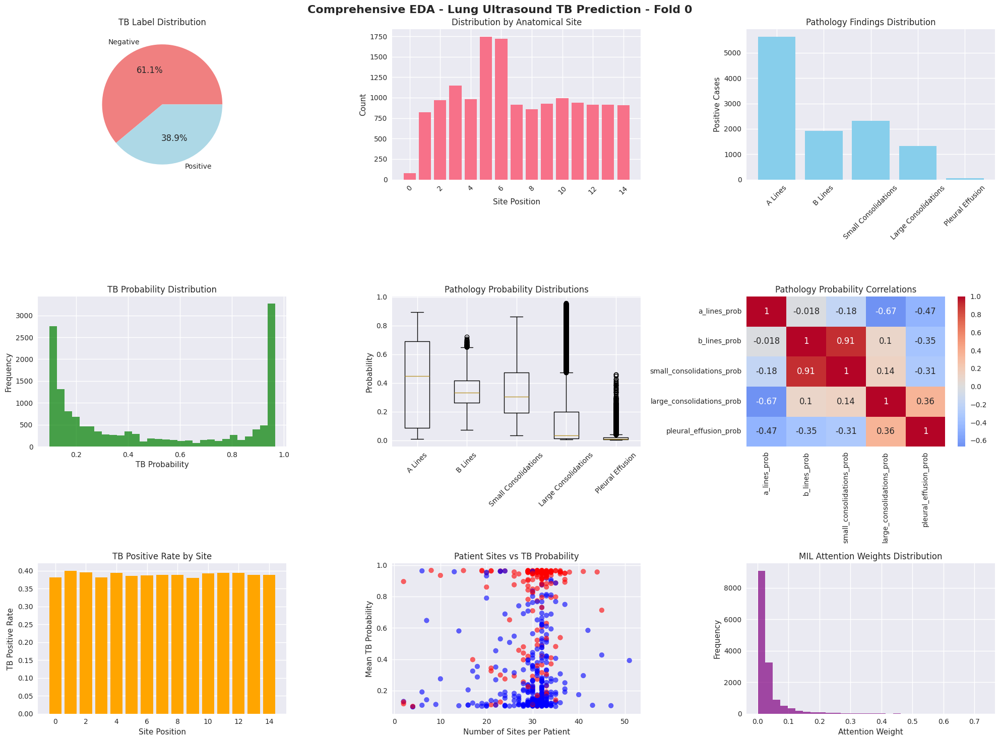


=== DATASET SUMMARY - Fold 0 ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7
2. Analyzing current model performance...


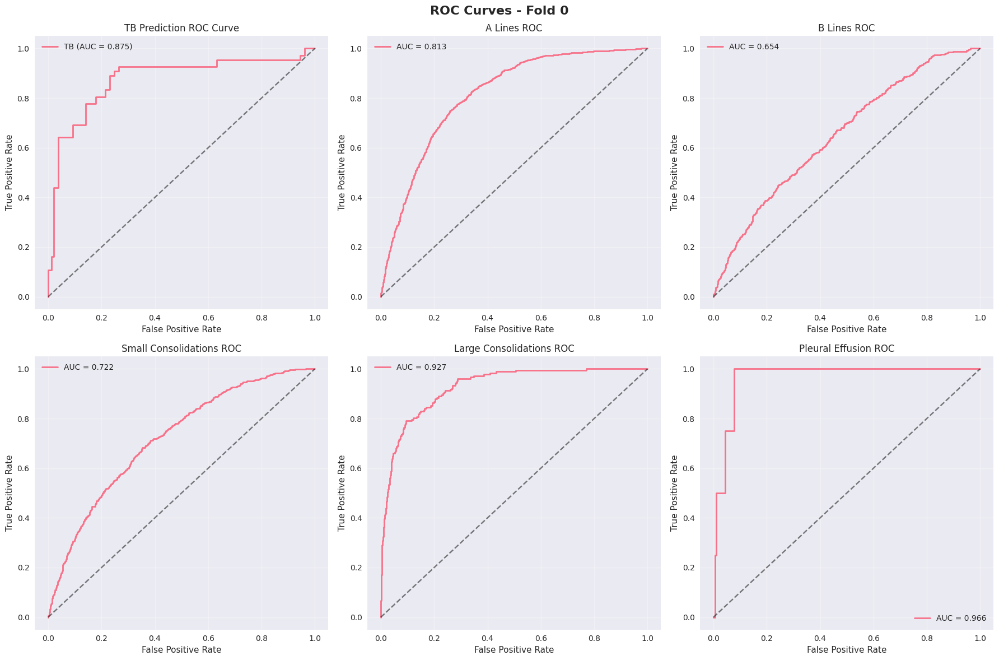

3. Analyzing MIL attention patterns...

Analyzing MIL Attention Patterns - Fold 0


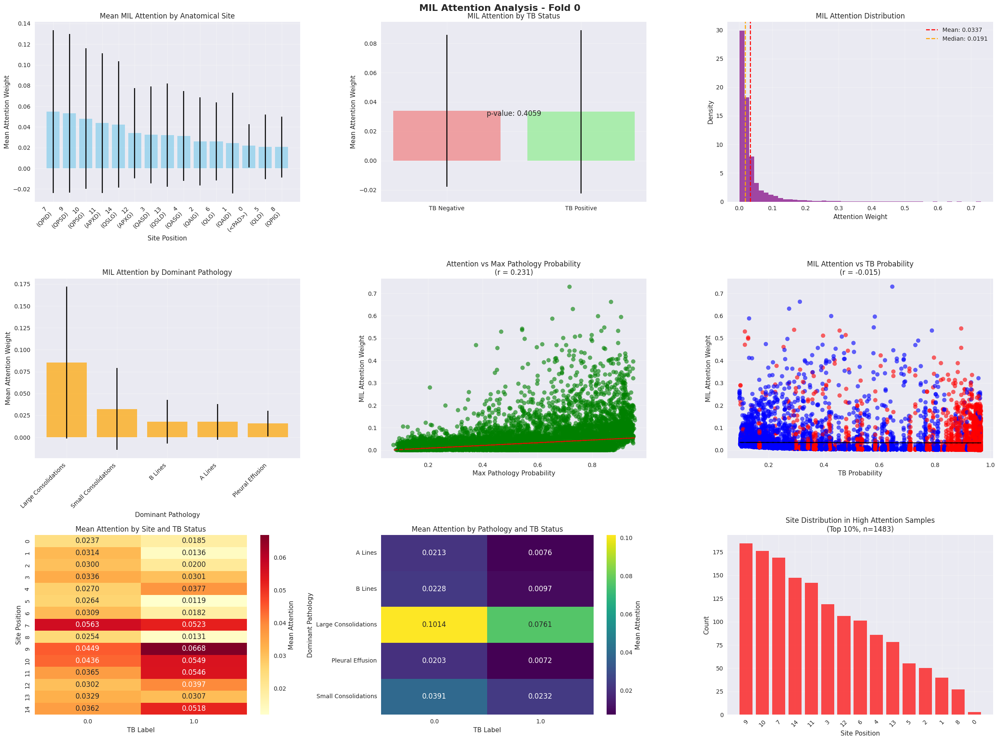


🔍 KEY ATTENTION FINDINGS - Fold 0:
----------------------------------------
• Overall attention mean: 0.0337
• TB correlation with attention: -0.0148
• TB+ vs TB- attention difference: p=0.4059 ns
• Highest attention site: 7 (QPID) - 0.0548
• Highest attention pathology: large_consolidations - 0.0852
4. Training individual pathology models...
Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...



Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


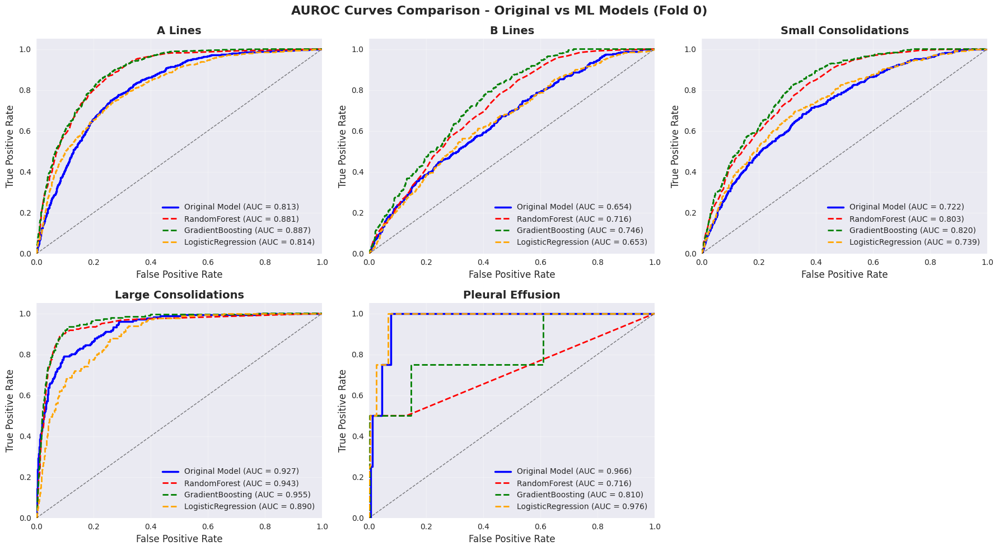


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 0

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.813
RandomForest AUC: 0.881
GradientBoosting AUC: 0.887
LogisticRegression AUC: 0.814
🏆 Best ML Model: GradientBoosting (AUC = 0.887)
Improvement: +0.075

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.654
RandomForest AUC: 0.716
GradientBoosting AUC: 0.746
LogisticRegression AUC: 0.653
🏆 Best ML Model: GradientBoosting (AUC = 0.746)
Improvement: +0.093

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.722
RandomForest AUC: 0.803
GradientBoosting AUC: 0.820
LogisticRegression AUC: 0.739
🏆 Best ML Model: GradientBoosting (AUC = 0.820)
Improvement: +0.099

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.927
RandomForest AUC: 0.943
GradientBoosting AUC: 0.955
Logistic

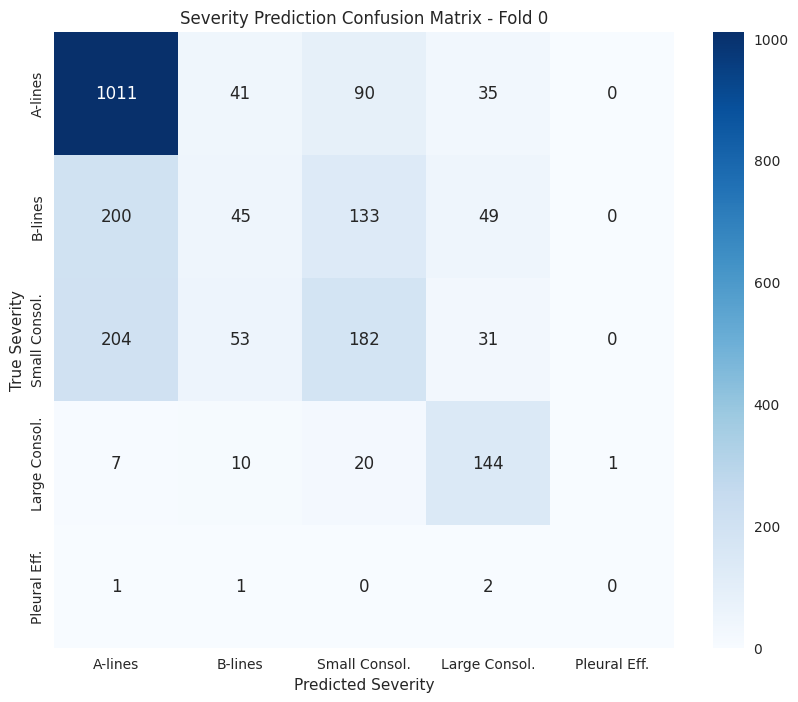

6. Training patient-level TB model...


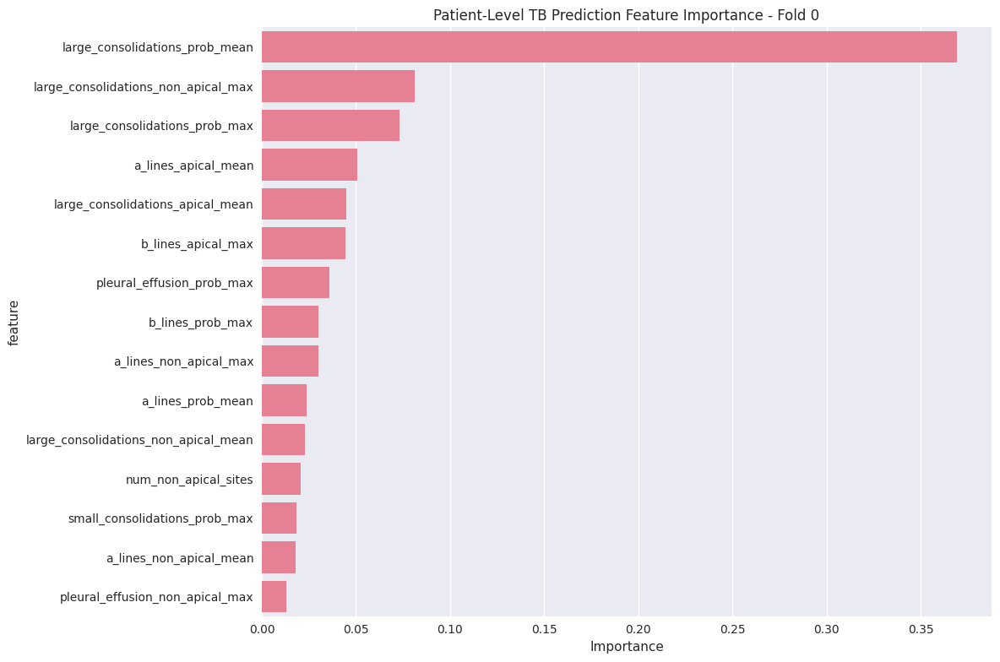

7. Analyzing combined approach...


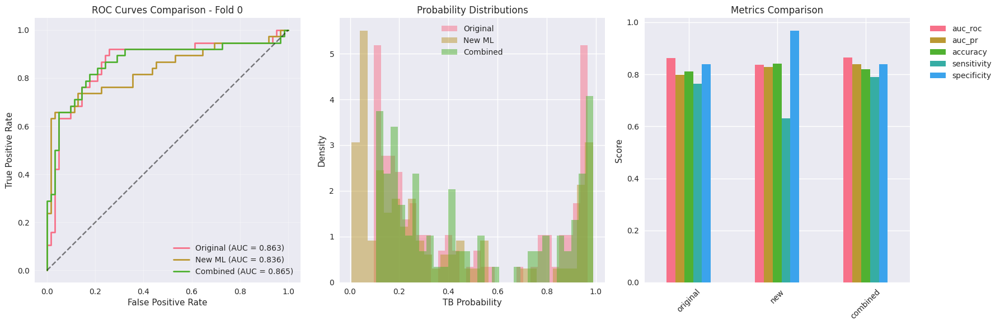


PROCESSING FOLD 1
1. Performing EDA...


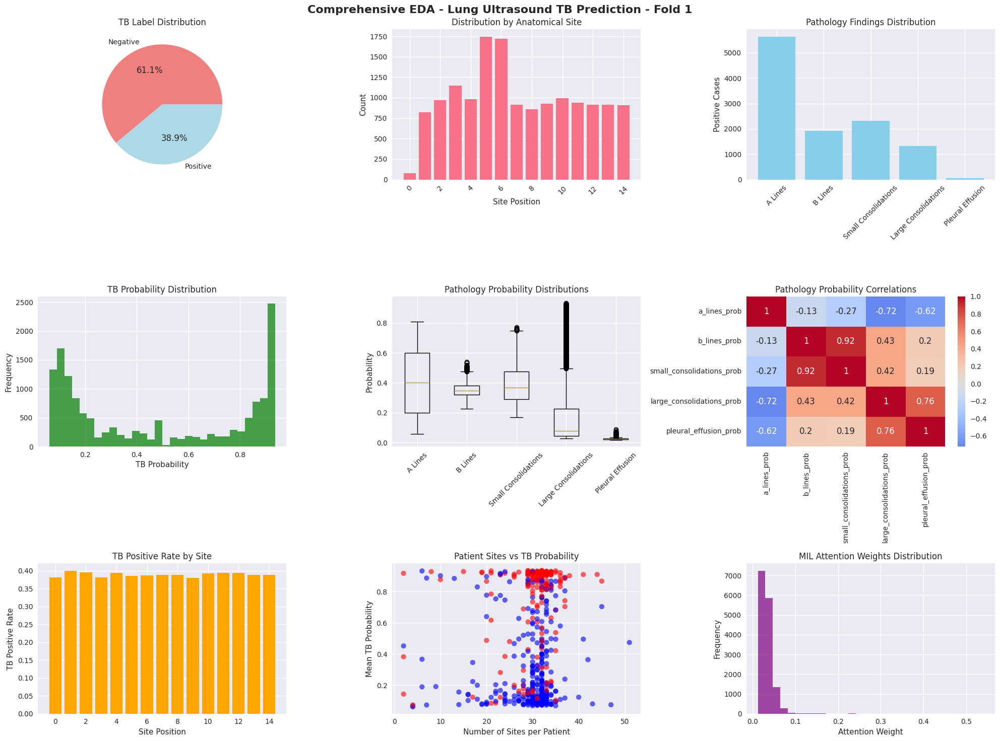


=== DATASET SUMMARY - Fold 1 ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7
2. Analyzing current model performance...


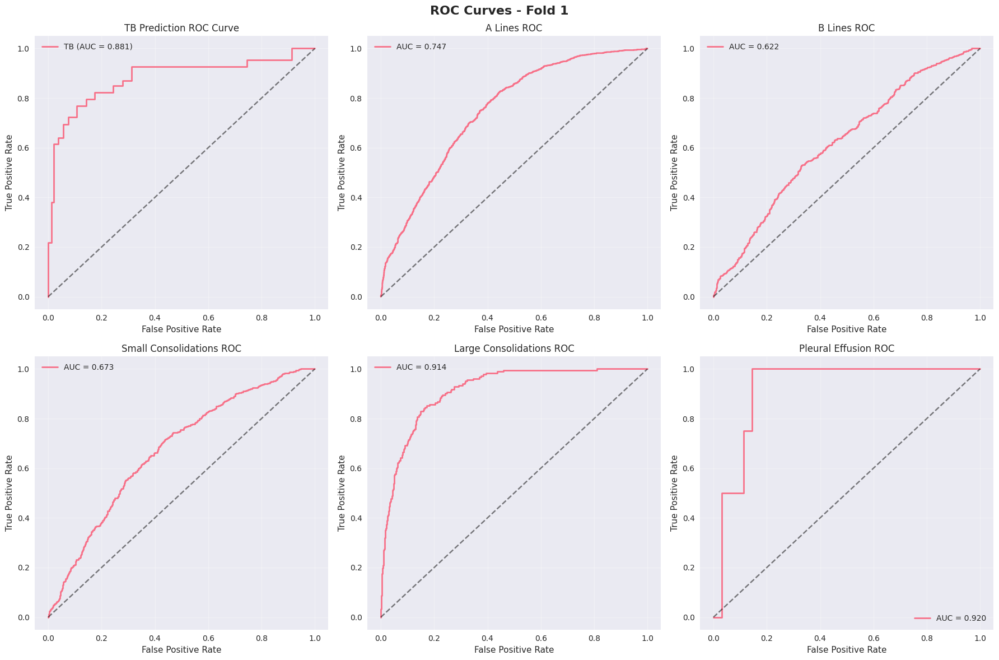

3. Analyzing MIL attention patterns...

Analyzing MIL Attention Patterns - Fold 1


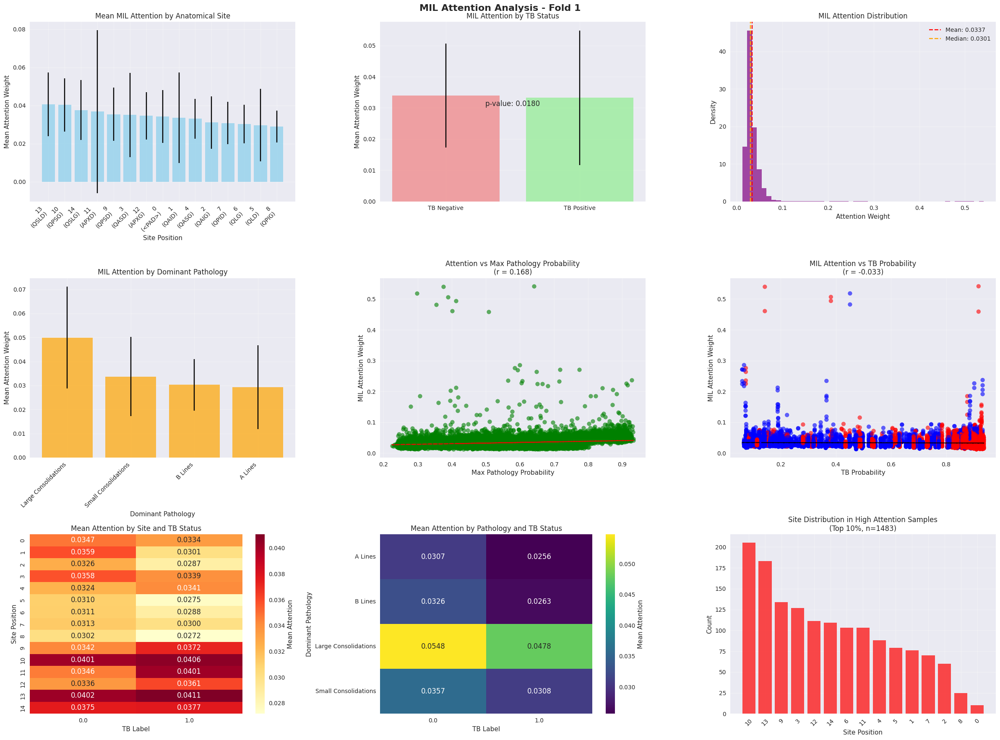


🔍 KEY ATTENTION FINDINGS - Fold 1:
----------------------------------------
• Overall attention mean: 0.0337
• TB correlation with attention: -0.0332
• TB+ vs TB- attention difference: p=0.0180 *
• Highest attention site: 13 (QSLD) - 0.0406
• Highest attention pathology: large_consolidations - 0.0499
4. Training individual pathology models...
Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...

Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


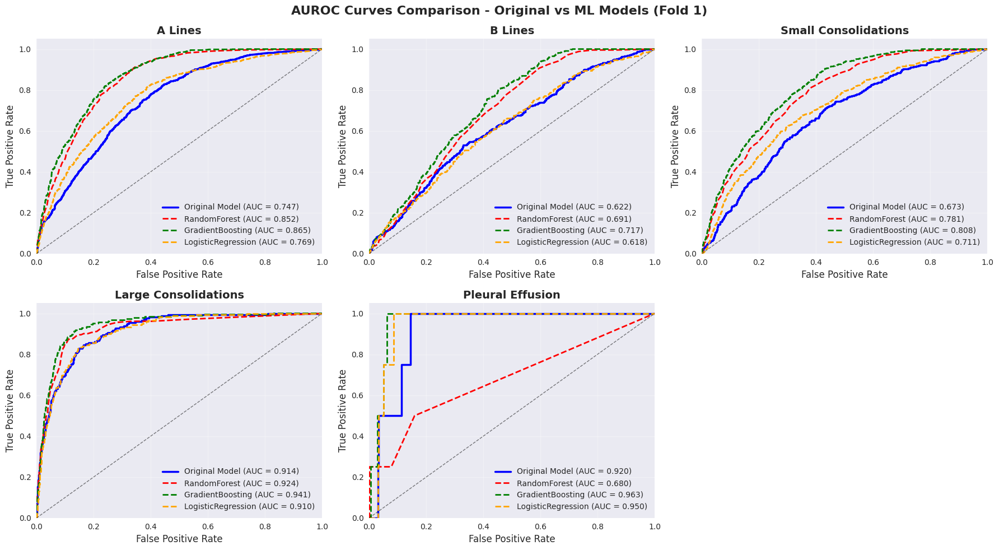


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 1

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.747
RandomForest AUC: 0.852
GradientBoosting AUC: 0.865
LogisticRegression AUC: 0.769
🏆 Best ML Model: GradientBoosting (AUC = 0.865)
Improvement: +0.118

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.622
RandomForest AUC: 0.691
GradientBoosting AUC: 0.717
LogisticRegression AUC: 0.618
🏆 Best ML Model: GradientBoosting (AUC = 0.717)
Improvement: +0.095

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.673
RandomForest AUC: 0.781
GradientBoosting AUC: 0.808
LogisticRegression AUC: 0.711
🏆 Best ML Model: GradientBoosting (AUC = 0.808)
Improvement: +0.135

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.914
RandomForest AUC: 0.924
GradientBoosting AUC: 0.941
Logistic

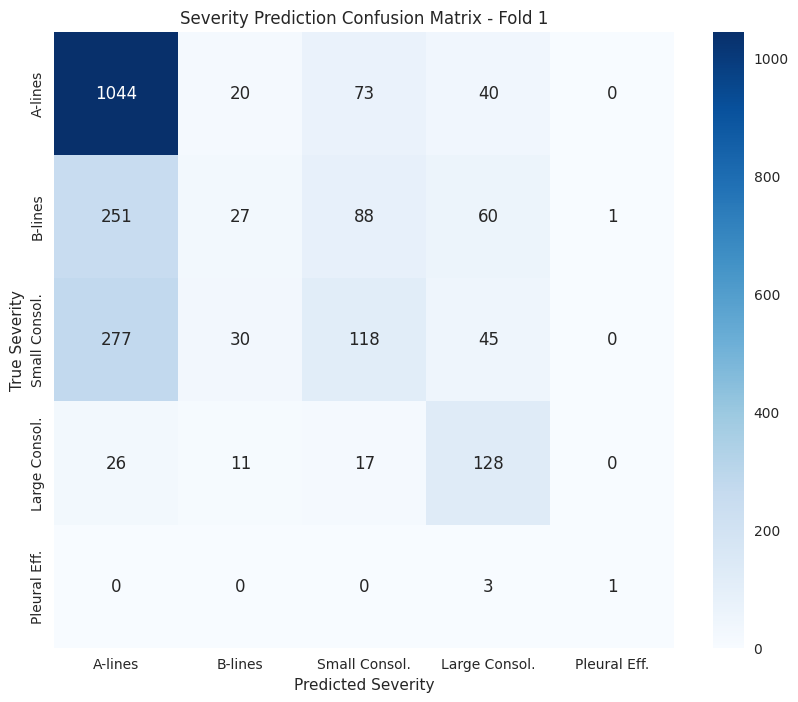

6. Training patient-level TB model...


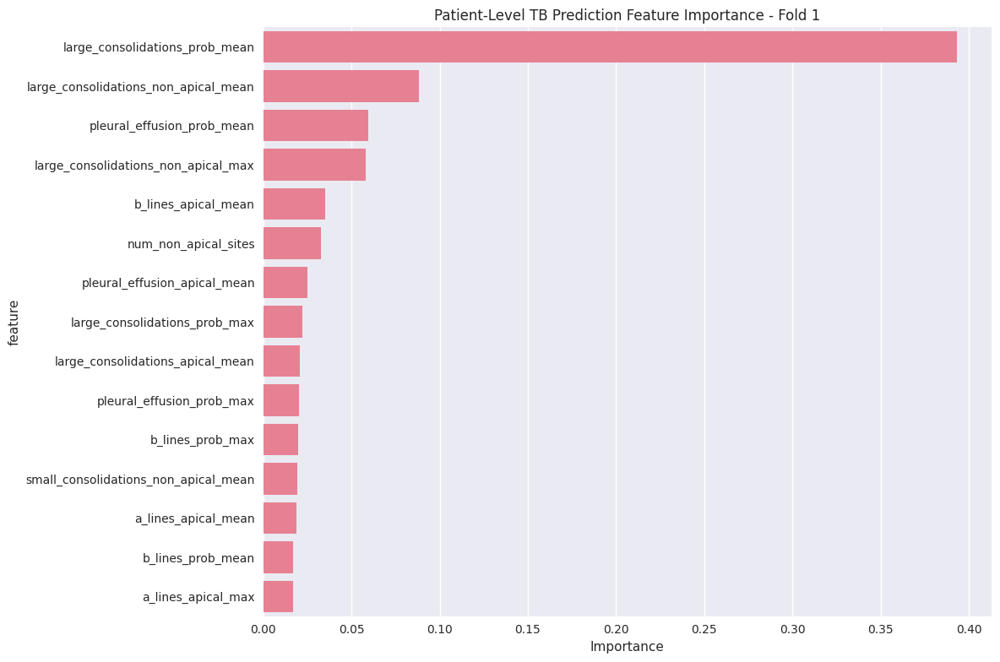

7. Analyzing combined approach...


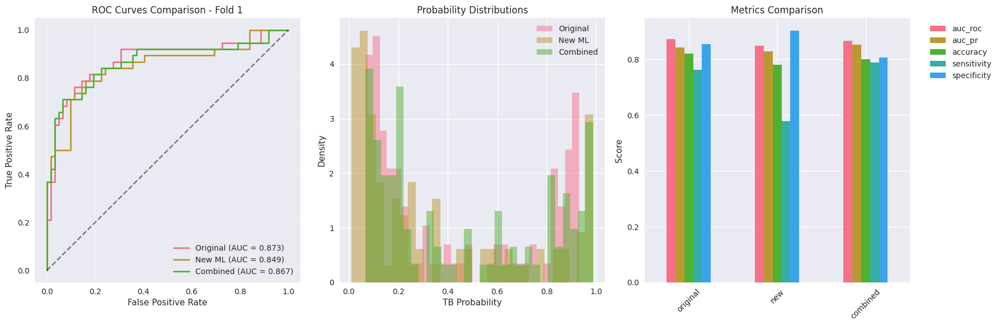


PROCESSING FOLD 2
1. Performing EDA...


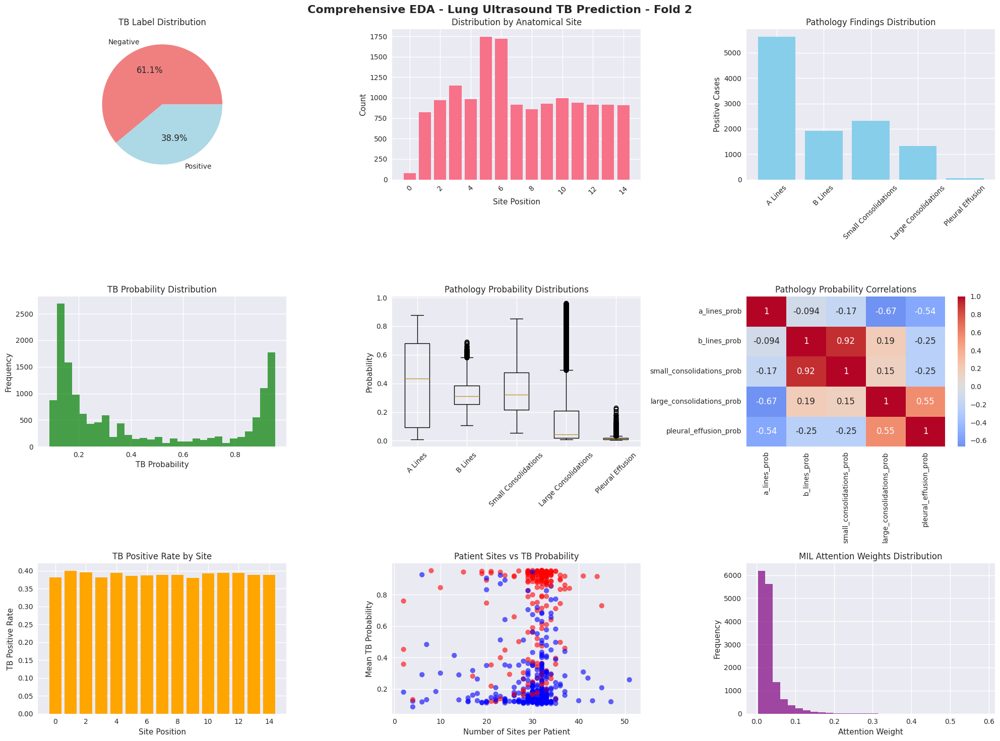


=== DATASET SUMMARY - Fold 2 ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7
2. Analyzing current model performance...


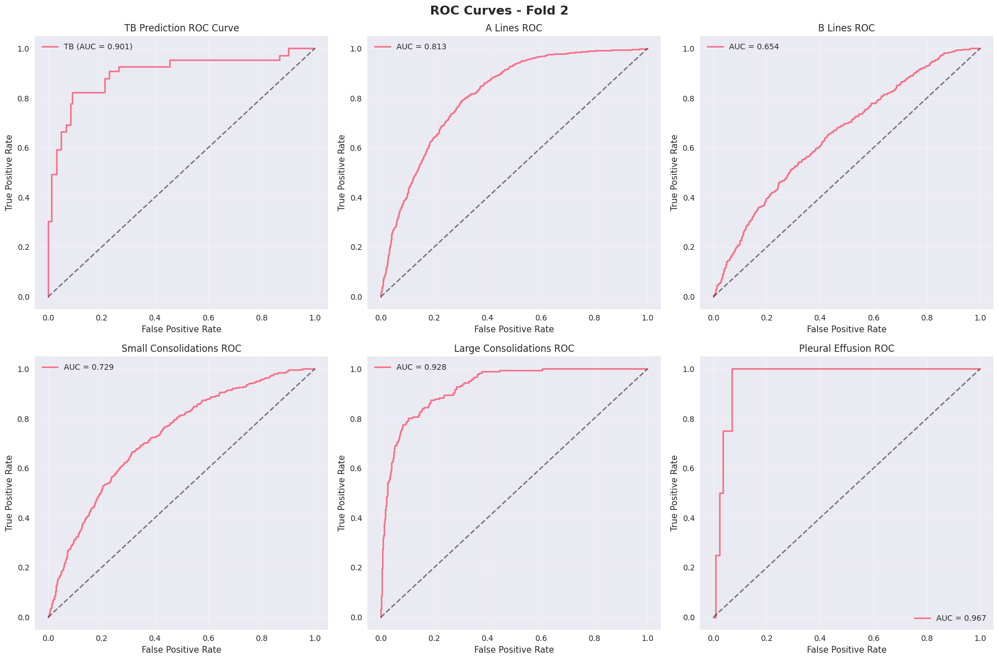

3. Analyzing MIL attention patterns...

Analyzing MIL Attention Patterns - Fold 2


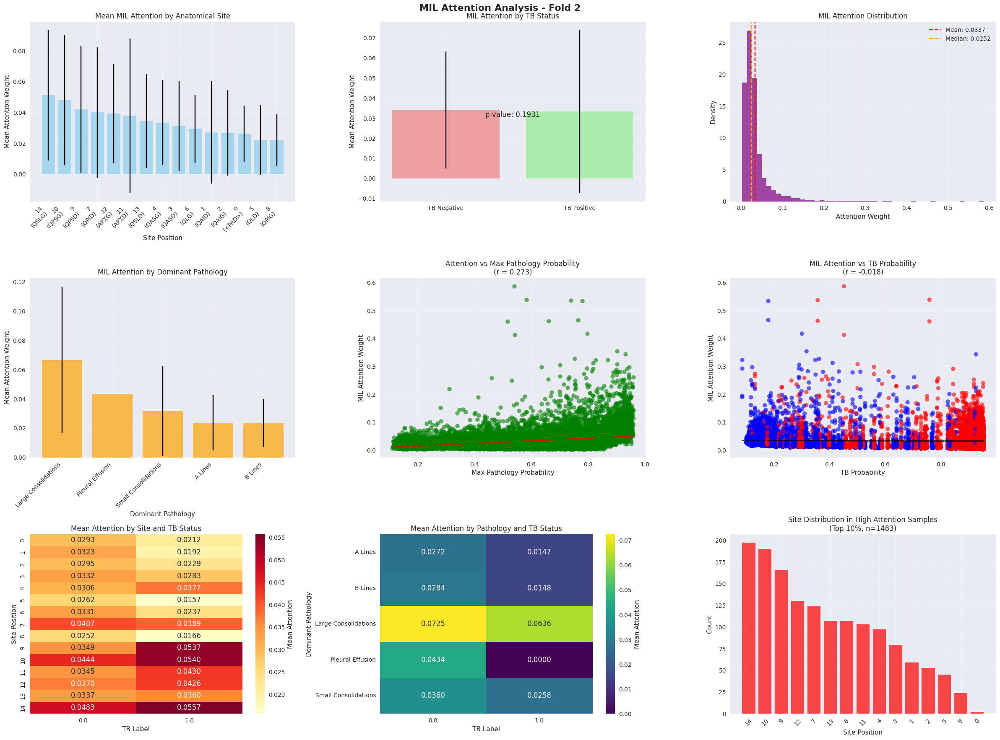


🔍 KEY ATTENTION FINDINGS - Fold 2:
----------------------------------------
• Overall attention mean: 0.0337
• TB correlation with attention: -0.0182
• TB+ vs TB- attention difference: p=0.1931 ns
• Highest attention site: 14 (QSLG) - 0.0512
• Highest attention pathology: large_consolidations - 0.0666
4. Training individual pathology models...
Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...

Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


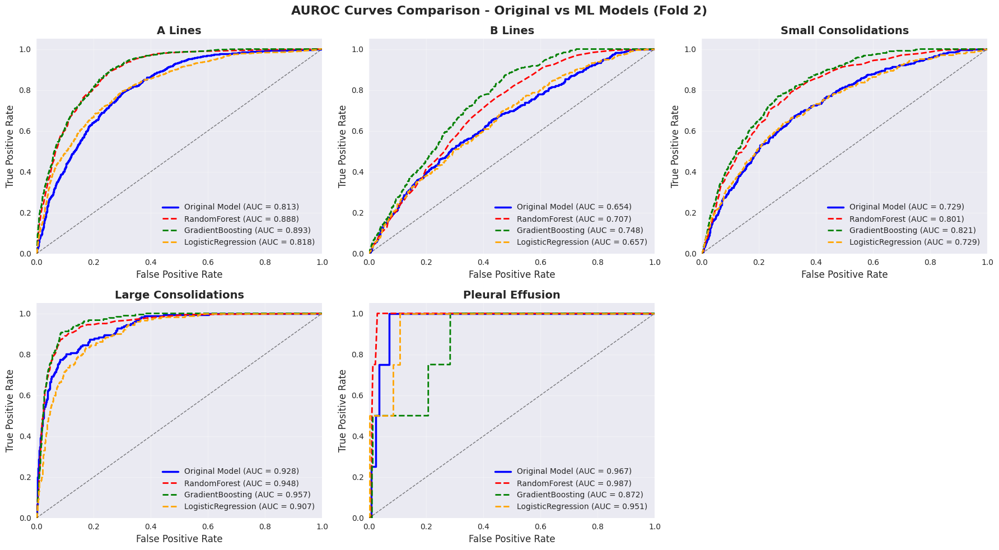


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 2

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.813
RandomForest AUC: 0.888
GradientBoosting AUC: 0.893
LogisticRegression AUC: 0.818
🏆 Best ML Model: GradientBoosting (AUC = 0.893)
Improvement: +0.079

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.654
RandomForest AUC: 0.707
GradientBoosting AUC: 0.748
LogisticRegression AUC: 0.657
🏆 Best ML Model: GradientBoosting (AUC = 0.748)
Improvement: +0.094

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.729
RandomForest AUC: 0.801
GradientBoosting AUC: 0.821
LogisticRegression AUC: 0.729
🏆 Best ML Model: GradientBoosting (AUC = 0.821)
Improvement: +0.092

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.928
RandomForest AUC: 0.948
GradientBoosting AUC: 0.957
Logistic

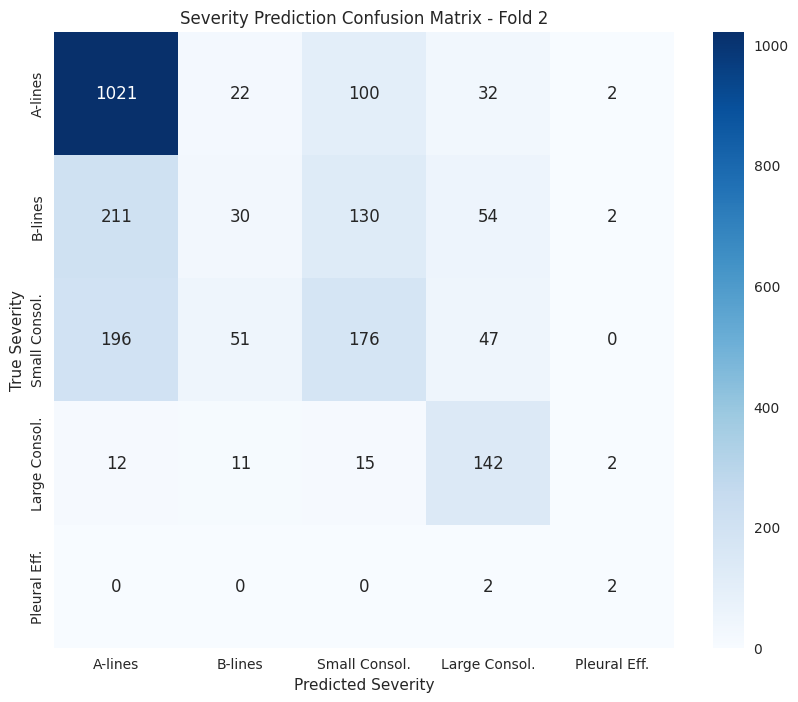

6. Training patient-level TB model...


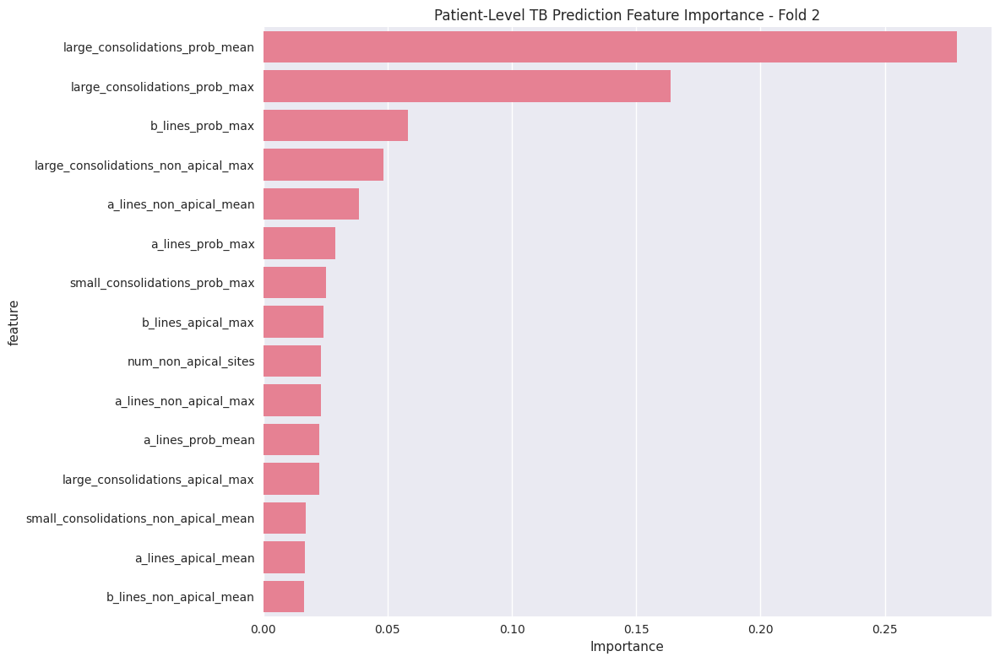

7. Analyzing combined approach...


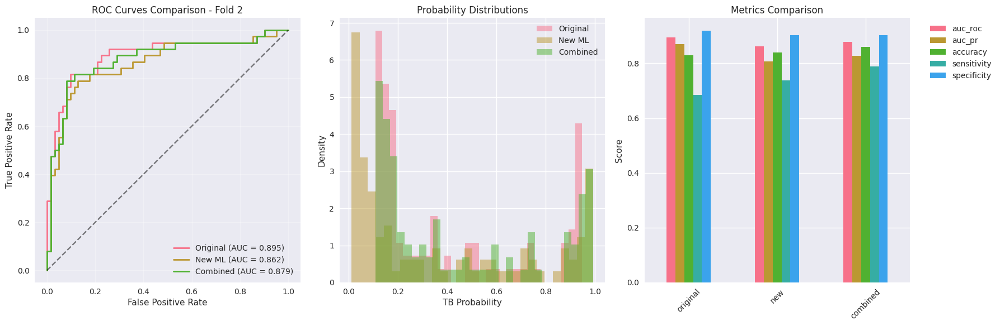


PROCESSING FOLD 3
1. Performing EDA...


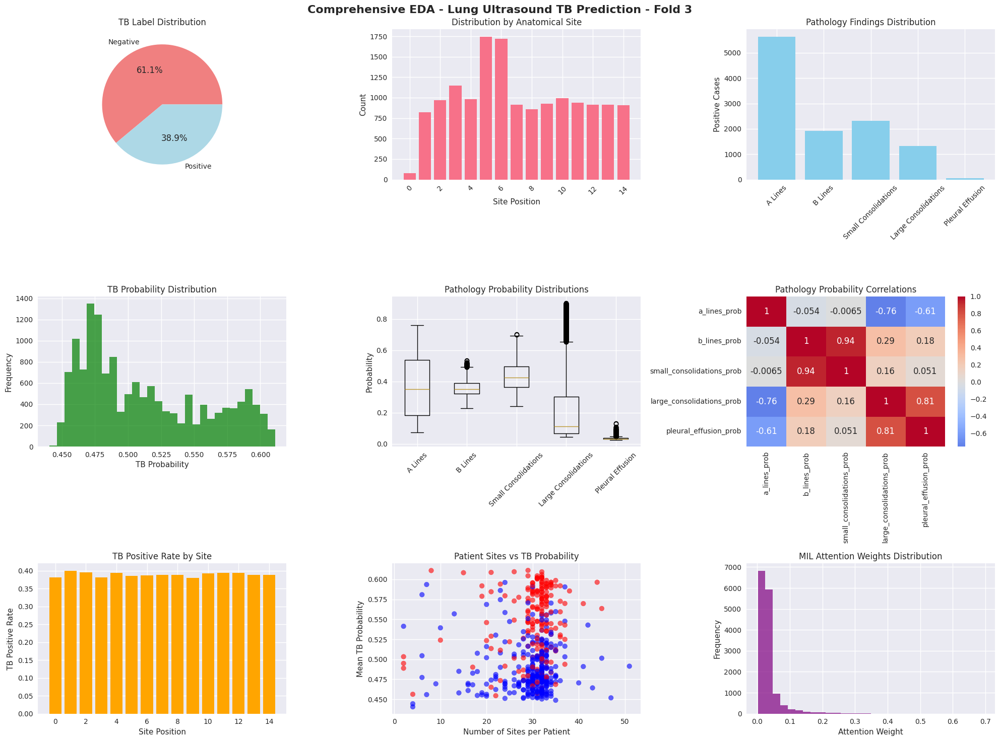


=== DATASET SUMMARY - Fold 3 ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7
2. Analyzing current model performance...


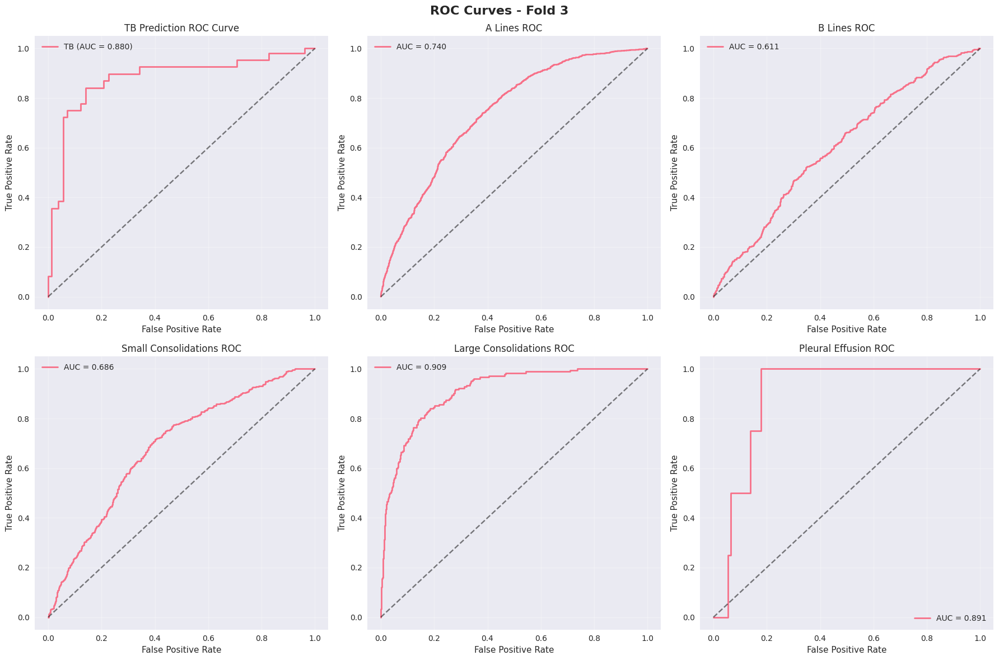

3. Analyzing MIL attention patterns...

Analyzing MIL Attention Patterns - Fold 3


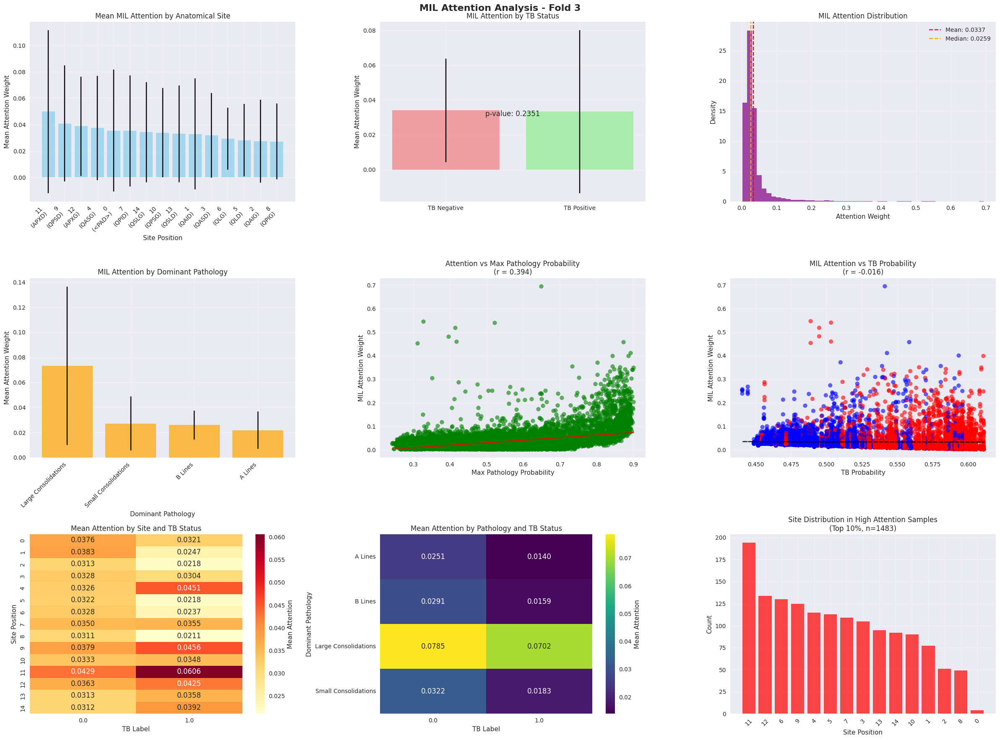


🔍 KEY ATTENTION FINDINGS - Fold 3:
----------------------------------------
• Overall attention mean: 0.0337
• TB correlation with attention: -0.0161
• TB+ vs TB- attention difference: p=0.2351 ns
• Highest attention site: 11 (APXD) - 0.0499
• Highest attention pathology: large_consolidations - 0.0731
4. Training individual pathology models...
Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...

Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


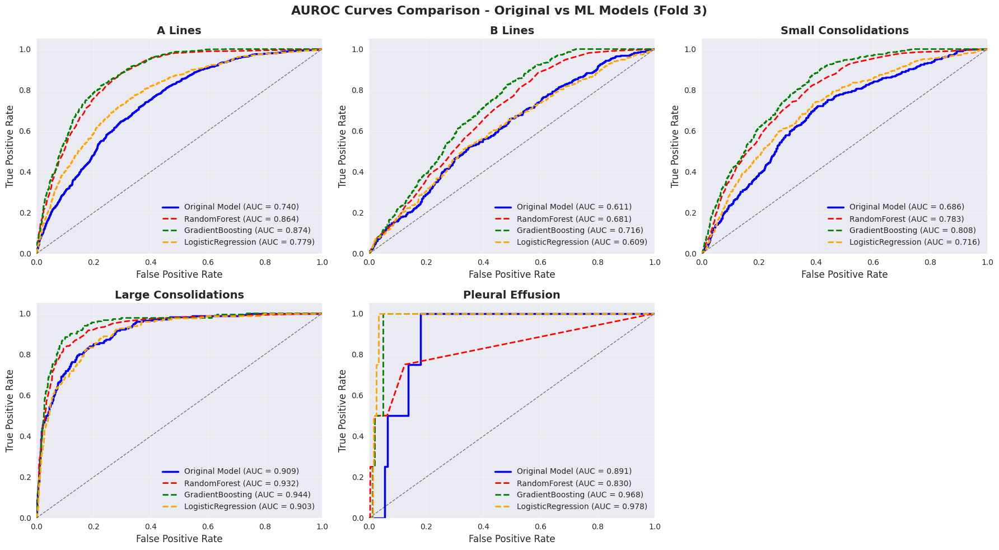


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 3

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.740
RandomForest AUC: 0.864
GradientBoosting AUC: 0.874
LogisticRegression AUC: 0.779
🏆 Best ML Model: GradientBoosting (AUC = 0.874)
Improvement: +0.134

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.611
RandomForest AUC: 0.681
GradientBoosting AUC: 0.716
LogisticRegression AUC: 0.609
🏆 Best ML Model: GradientBoosting (AUC = 0.716)
Improvement: +0.105

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.686
RandomForest AUC: 0.783
GradientBoosting AUC: 0.808
LogisticRegression AUC: 0.716
🏆 Best ML Model: GradientBoosting (AUC = 0.808)
Improvement: +0.122

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.909
RandomForest AUC: 0.932
GradientBoosting AUC: 0.944
Logistic

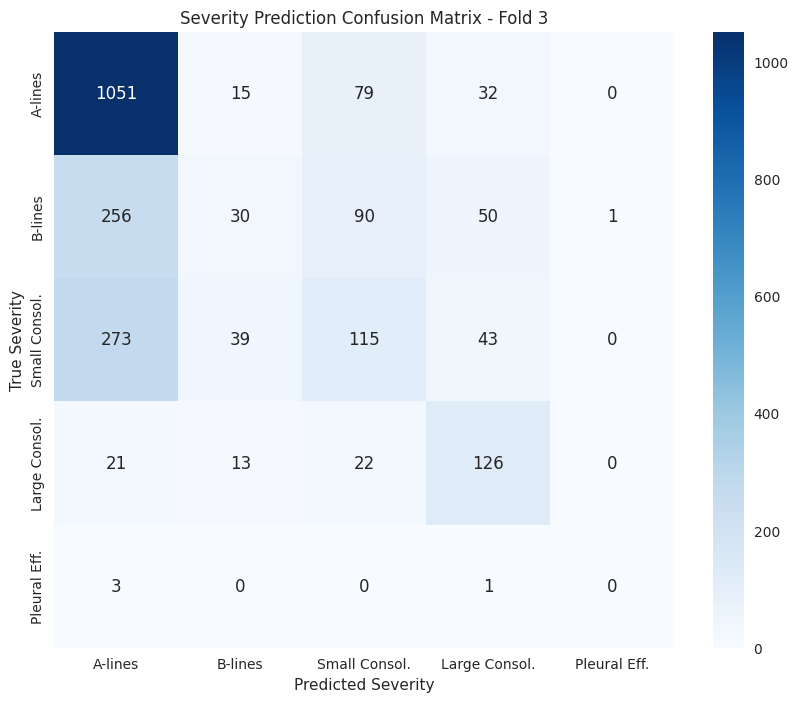

6. Training patient-level TB model...


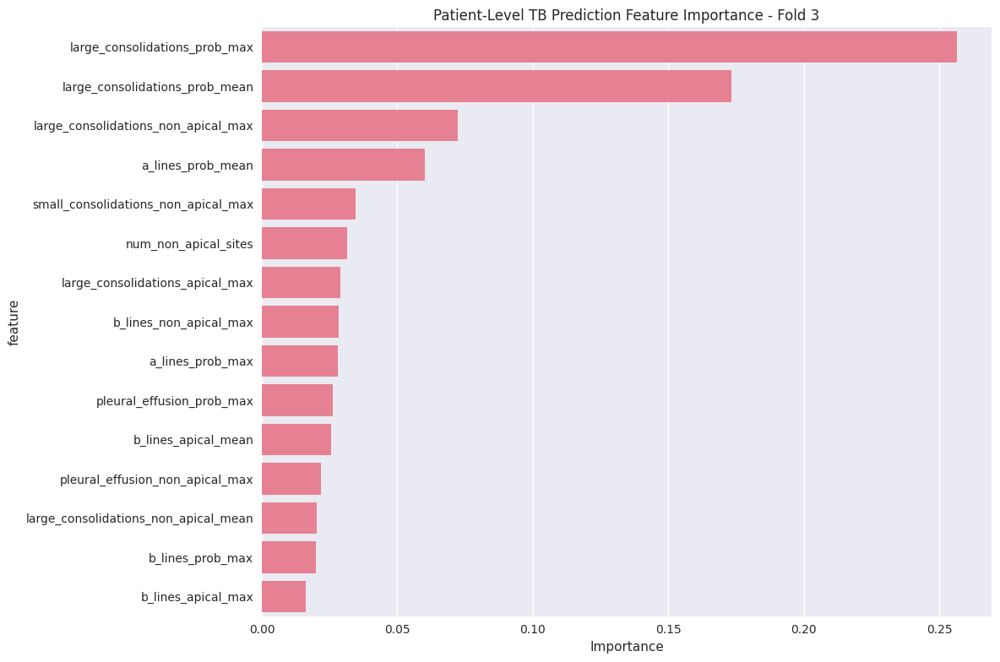

7. Analyzing combined approach...


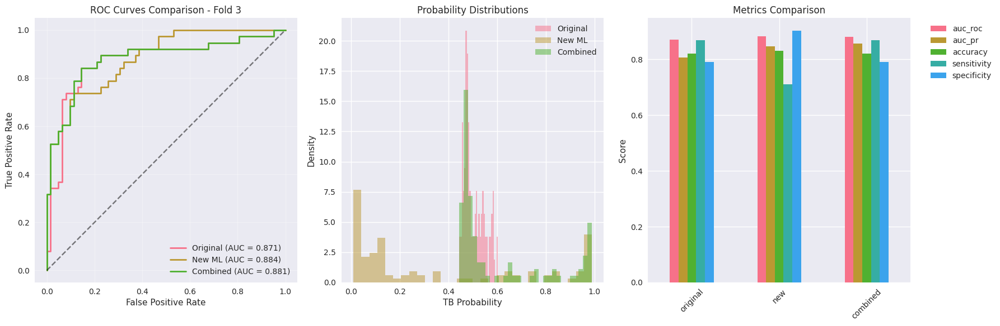


PROCESSING FOLD 4
1. Performing EDA...


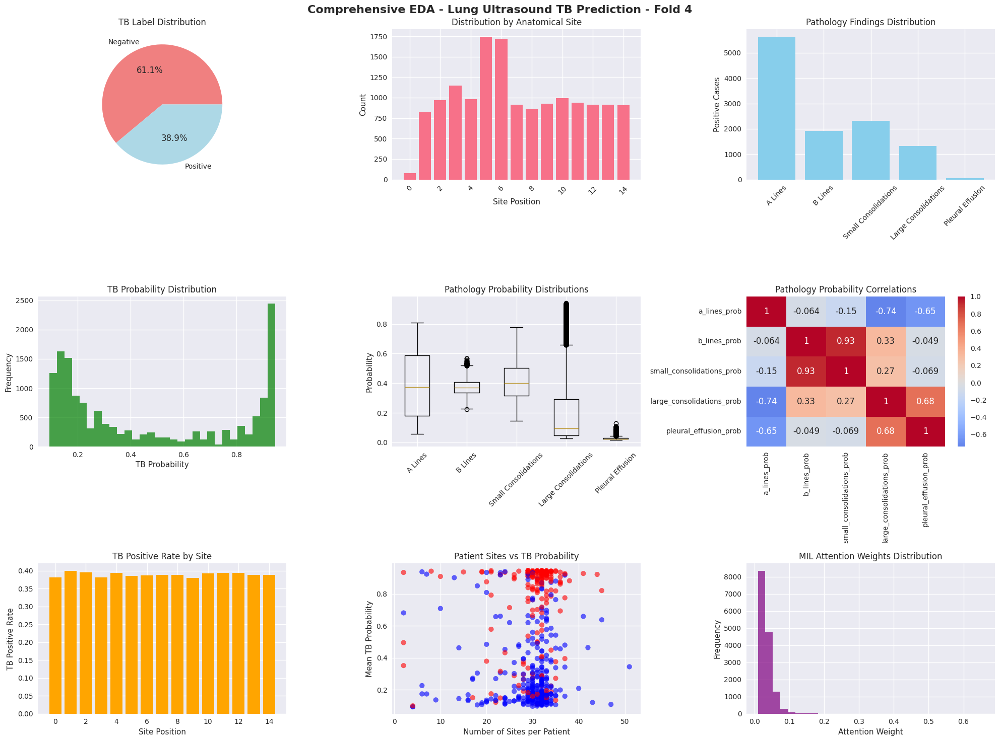


=== DATASET SUMMARY - Fold 4 ===
Total samples: 14828
Unique patients: 500
Unique sites: 15
TB positive rate: 0.389
Mean sites per patient: 29.7
2. Analyzing current model performance...


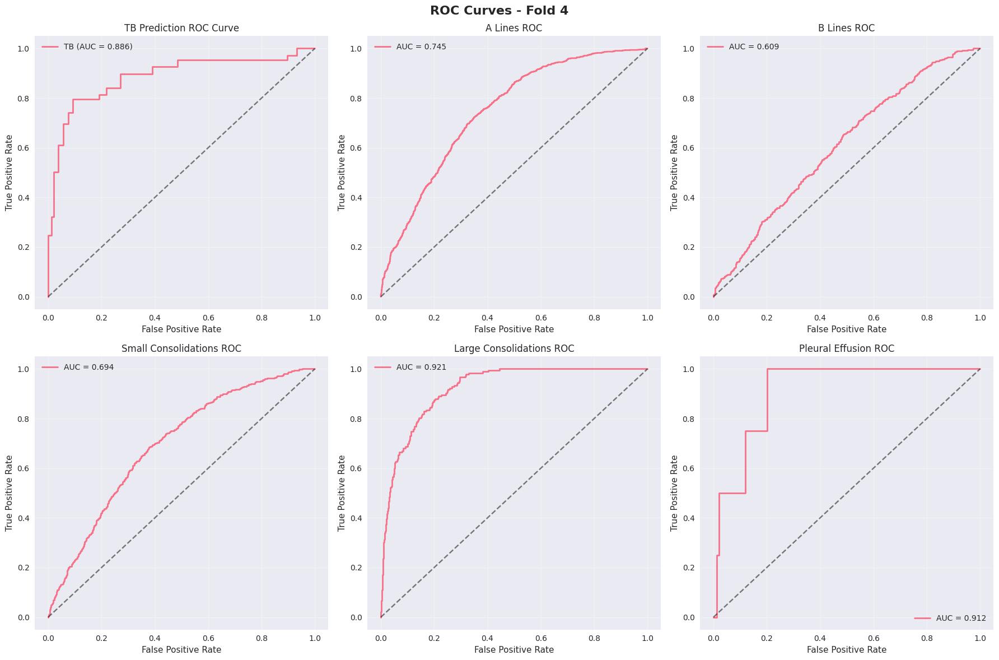

3. Analyzing MIL attention patterns...

Analyzing MIL Attention Patterns - Fold 4


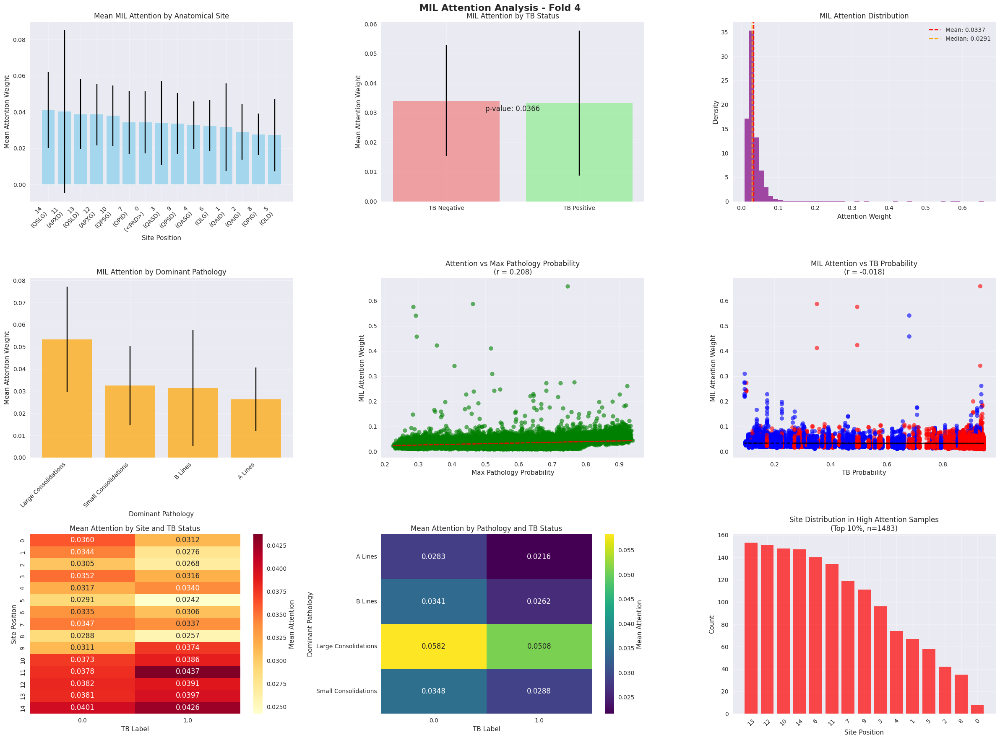


🔍 KEY ATTENTION FINDINGS - Fold 4:
----------------------------------------
• Overall attention mean: 0.0337
• TB correlation with attention: -0.0185
• TB+ vs TB- attention difference: p=0.0366 *
• Highest attention site: 14 (QSLG) - 0.0410
• Highest attention pathology: large_consolidations - 0.0534
4. Training individual pathology models...
Training pathology models with features: ['a_lines_prob', 'b_lines_prob', 'small_consolidations_prob', 'large_consolidations_prob', 'pleural_effusion_prob', 'site_index', 'mil_attention']

Training model for a_lines...

Training model for b_lines...

Training model for small_consolidations...

Training model for large_consolidations...

Training model for pleural_effusion...

Generating AUROC comparison plots...


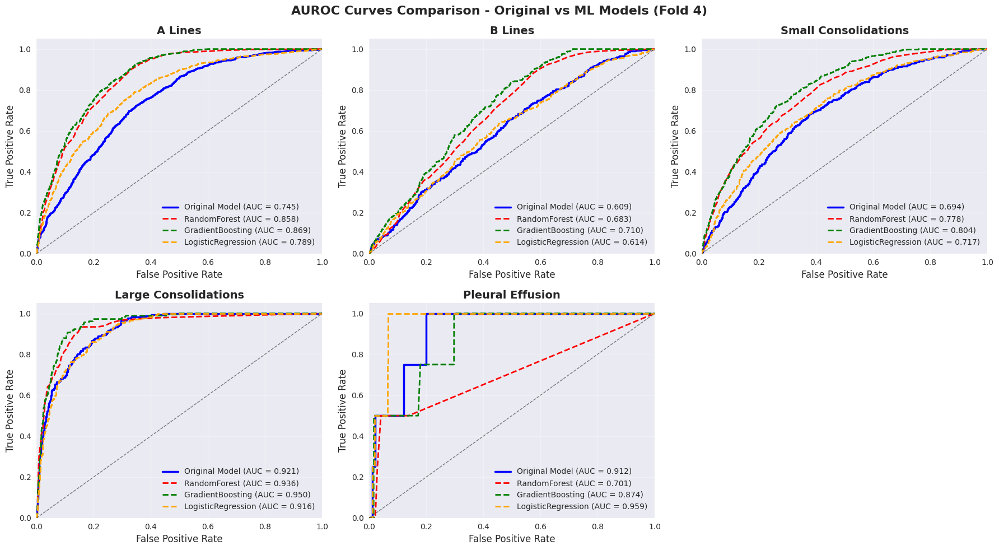


📊 PATHOLOGY MODEL PERFORMANCE SUMMARY - Fold 4

🔬 A Lines:
------------------------------
Positive cases: 1177.0/2956 (39.8%)
Original Model AUC: 0.745
RandomForest AUC: 0.858
GradientBoosting AUC: 0.869
LogisticRegression AUC: 0.789
🏆 Best ML Model: GradientBoosting (AUC = 0.869)
Improvement: +0.124

🔬 B Lines:
------------------------------
Positive cases: 427.0/2956 (14.4%)
Original Model AUC: 0.609
RandomForest AUC: 0.683
GradientBoosting AUC: 0.710
LogisticRegression AUC: 0.614
🏆 Best ML Model: GradientBoosting (AUC = 0.710)
Improvement: +0.101

🔬 Small Consolidations:
------------------------------
Positive cases: 470.0/2956 (15.9%)
Original Model AUC: 0.694
RandomForest AUC: 0.778
GradientBoosting AUC: 0.804
LogisticRegression AUC: 0.717
🏆 Best ML Model: GradientBoosting (AUC = 0.804)
Improvement: +0.110

🔬 Large Consolidations:
------------------------------
Positive cases: 182.0/2956 (6.2%)
Original Model AUC: 0.921
RandomForest AUC: 0.936
GradientBoosting AUC: 0.950
Logistic

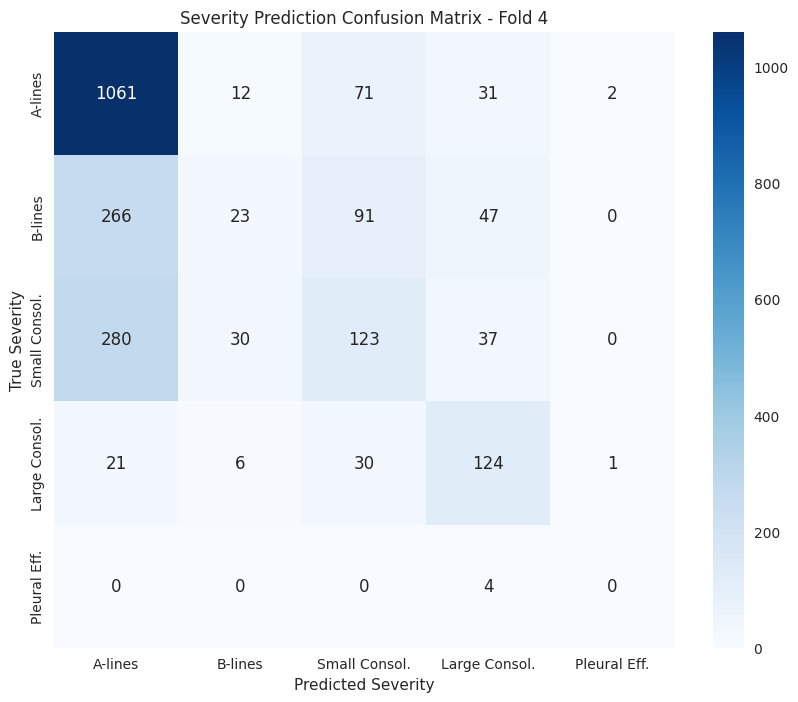

6. Training patient-level TB model...


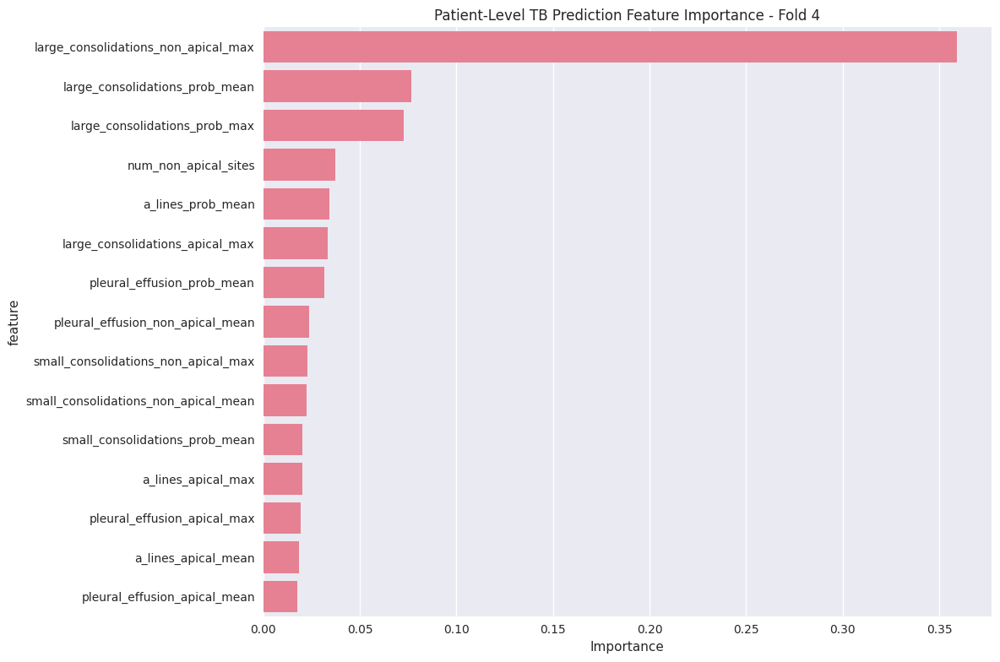

7. Analyzing combined approach...


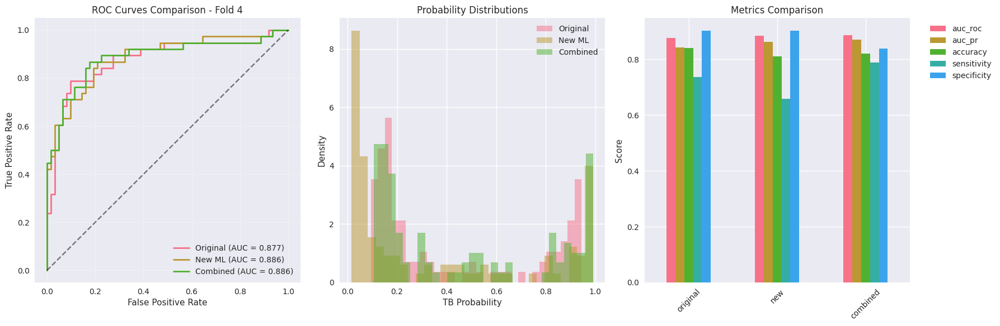


CROSS-FOLD ANALYSIS AND VISUALIZATION

8. Analyzing attention patterns across folds...

ATTENTION ANALYSIS ACROSS ALL FOLDS

📊 AGGREGATE ATTENTION STATISTICS (5 folds):
--------------------------------------------------
• TB-Attention correlation: -0.0202 ± 0.0067
• Pathology-Attention correlation: 0.2550 ± 0.0775

🎯 TOP ATTENTION SITES (across 5 folds):
--------------------------------------------------
1. Site 11 (APXD): 0.0417 ± 0.0047
2. Site 10 (QPSG): 0.0416 ± 0.0057
3. Site 14 (QSLG): 0.0413 ± 0.0057
4. Site 9 (QPSD): 0.0410 ± 0.0069
5. Site 7 (QPID): 0.0390 ± 0.0084


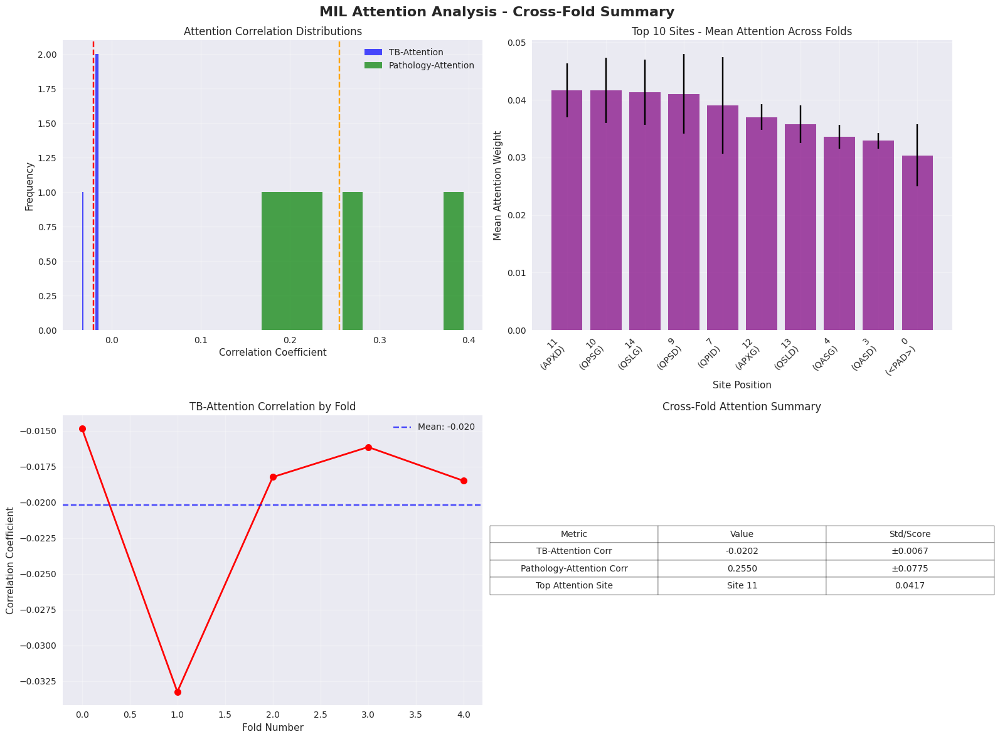


9. Creating pathology performance summary across folds...

PATHOLOGY MODEL PERFORMANCE ACROSS ALL FOLDS


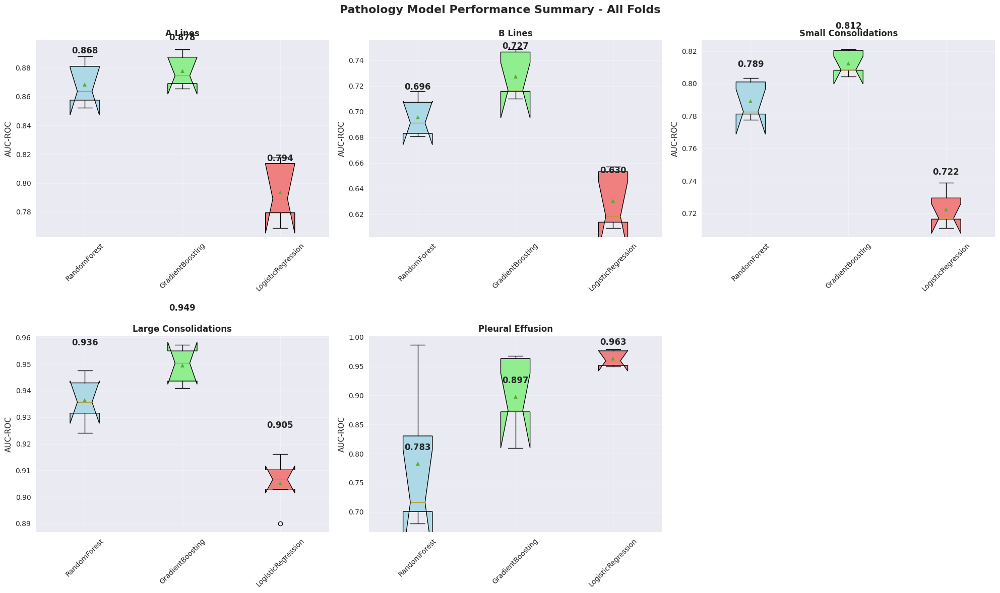


📊 NUMERICAL SUMMARY:
------------------------------------------------------------

🔬 A Lines:
------------------------------
RandomForest   : 0.868 ± 0.014 [0.851, 0.885] (n=5)
GradientBoosting: 0.878 ± 0.011 [0.865, 0.891] (n=5)
LogisticRegression: 0.794 ± 0.019 [0.770, 0.817] (n=5)

🔬 B Lines:
------------------------------
RandomForest   : 0.696 ± 0.014 [0.678, 0.713] (n=5)
GradientBoosting: 0.727 ± 0.016 [0.707, 0.748] (n=5)
LogisticRegression: 0.630 ± 0.020 [0.605, 0.656] (n=5)

🔬 Small Consolidations:
------------------------------
RandomForest   : 0.789 ± 0.011 [0.776, 0.803] (n=5)
GradientBoosting: 0.812 ± 0.007 [0.804, 0.821] (n=5)
LogisticRegression: 0.722 ± 0.010 [0.710, 0.735] (n=5)

🔬 Large Consolidations:
------------------------------
RandomForest   : 0.936 ± 0.008 [0.926, 0.947] (n=5)
GradientBoosting: 0.949 ± 0.006 [0.942, 0.957] (n=5)
LogisticRegression: 0.905 ± 0.009 [0.894, 0.916] (n=5)

🔬 Pleural Effusion:
------------------------------
RandomForest   : 0.783 ± 0.

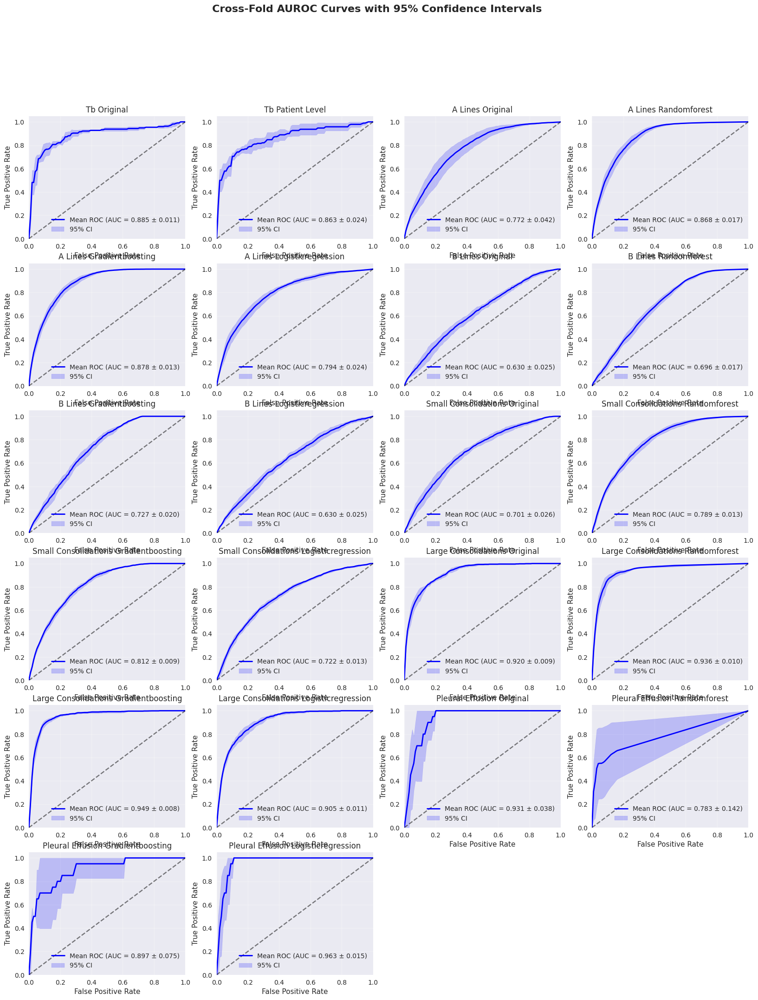

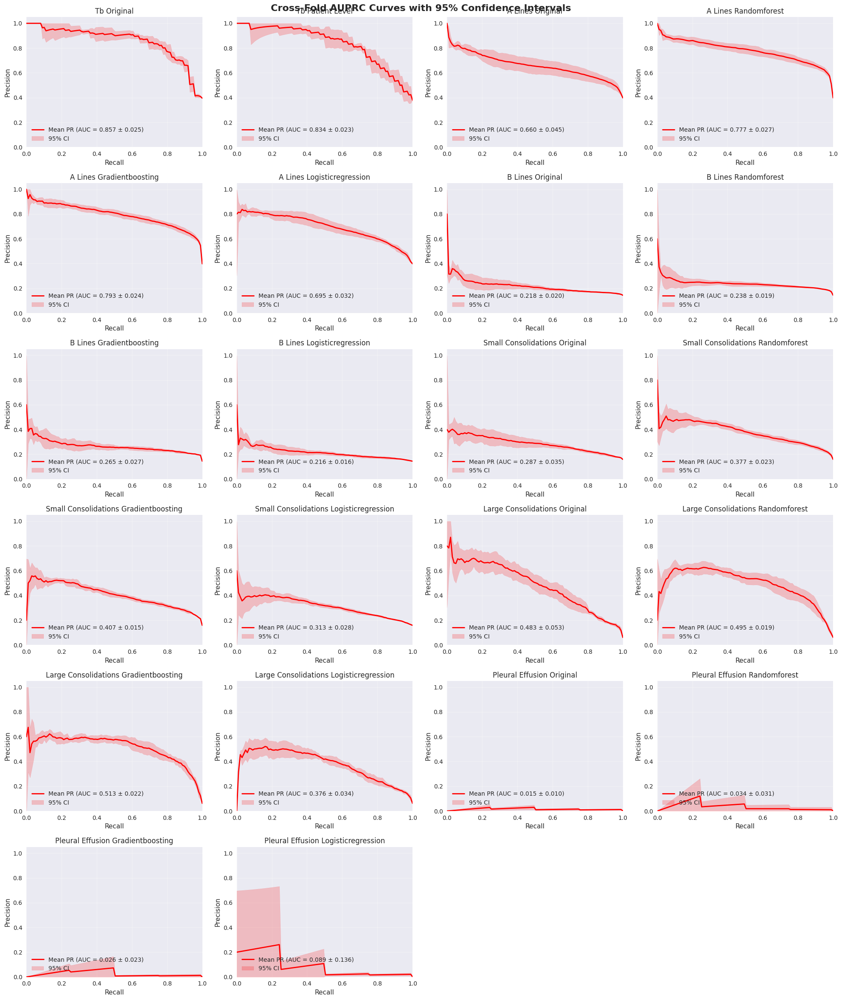


12. Creating comprehensive performance table...

COMPREHENSIVE PERFORMANCE SUMMARY - ALL FOLDS

📊 TB Original:
------------------------------------------------------------
  AUC ROC     :    0.885       [0.872, 0.897]
  AUC PR      :    0.857       [0.829, 0.885]
  ACCURACY    :    0.826       [0.814, 0.838]
  SENSITIVITY :    0.770       [0.689, 0.850]
  SPECIFICITY :    0.863       [0.799, 0.927]

📊 TB Patient Level:
------------------------------------------------------------
  AUC ROC     :    0.863       [0.837, 0.890]
  AUC PR      :    0.834       [0.808, 0.860]
  ACCURACY    :    0.820       [0.788, 0.852]
  SENSITIVITY :    0.663       [0.585, 0.741]
  SPECIFICITY :    0.916       [0.880, 0.952]

📊 A Lines Original:
------------------------------------------------------------
  AUC ROC     :    0.772       [0.725, 0.819]
  AUC PR      :    0.660       [0.609, 0.710]
  ACCURACY    :    0.704       [0.666, 0.742]
  SENSITIVITY :    0.635       [0.535, 0.735]
  SPECIFICITY :    

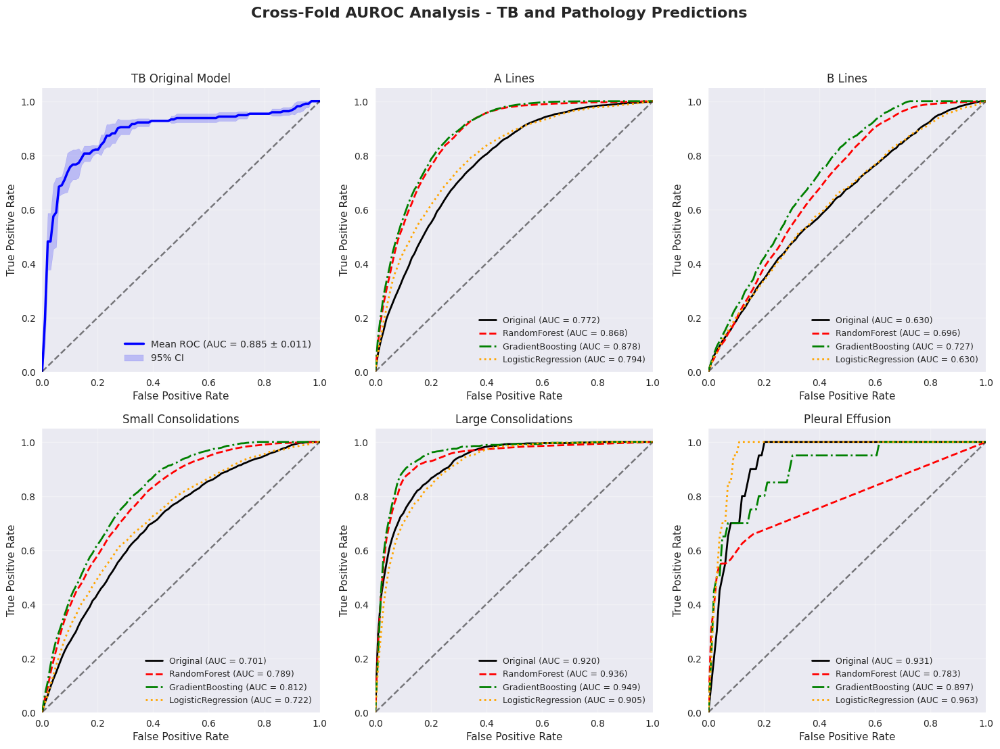

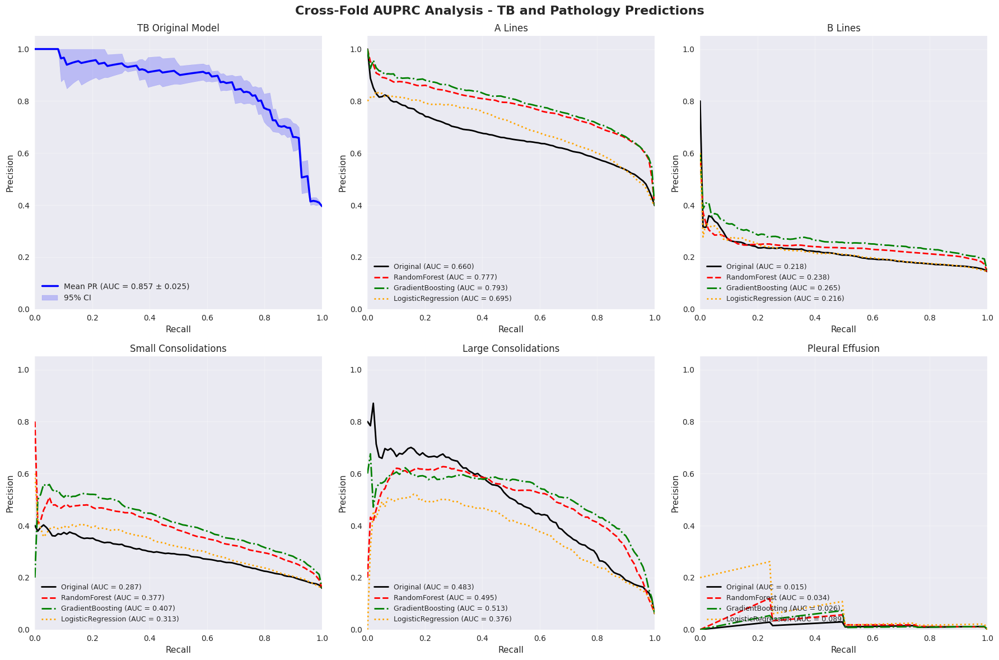


🎯 CROSS-FOLD VISUALIZATION SUMMARY
📊 Generated 6 plots per metric:
   • 1 TB prediction plot (with 95% CI)
   • 5 pathology plots (original + ML models)
📈 Total plots created: 12 (AUROC + AUPRC)

📋 Model Comparison Summary:
----------------------------------------

🔬 A Lines:
   Original       : 0.772
   RandomForest   : 0.868
   GradientBoosting: 0.878
   LogisticRegression: 0.794
   🏆 Best: GradientBoosting (0.878)

🔬 B Lines:
   Original       : 0.630
   RandomForest   : 0.696
   GradientBoosting: 0.727
   LogisticRegression: 0.630
   🏆 Best: GradientBoosting (0.727)

🔬 Small Consolidations:
   Original       : 0.701
   RandomForest   : 0.789
   GradientBoosting: 0.812
   LogisticRegression: 0.722
   🏆 Best: GradientBoosting (0.812)

🔬 Large Consolidations:
   Original       : 0.920
   RandomForest   : 0.936
   GradientBoosting: 0.949
   LogisticRegression: 0.905
   🏆 Best: GradientBoosting (0.949)

🔬 Pleural Effusion:
   Original       : 0.931
   RandomForest   : 0.783
   Gradient

In [29]:
def compute_mean_roc_curve(y_true_list, y_prob_list):
    """Compute mean ROC curve with confidence intervals across folds"""
    
    # Create common FPR grid
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
    aucs = []
    
    for y_true, y_prob in zip(y_true_list, y_prob_list):
        if len(np.unique(y_true)) > 1:  # Only if we have both classes
            fpr, tpr, _ = roc_curve(y_true, y_prob)
            # Interpolate TPR at common FPR points
            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(roc_auc_score(y_true, y_prob))
    
    if not tprs:
        return None, None, None, None, None
    
    # Compute statistics
    tprs = np.array(tprs)
    mean_tpr = np.mean(tprs, axis=0)
    std_tpr = np.std(tprs, axis=0)
    
    # 95% CI
    n_folds = len(tprs)
    t_score = stats.t.ppf(0.975, n_folds-1)
    ci_tpr = t_score * std_tpr / np.sqrt(n_folds)
    
    tpr_upper = np.minimum(mean_tpr + ci_tpr, 1)
    tpr_lower = np.maximum(mean_tpr - ci_tpr, 0)
    
    mean_auc = np.mean(aucs)
    std_auc = np.std(aucs)
    ci_auc = t_score * std_auc / np.sqrt(n_folds)
    
    return mean_fpr, mean_tpr, tpr_lower, tpr_upper, (mean_auc, mean_auc - ci_auc, mean_auc + ci_auc)

def compute_mean_pr_curve(y_true_list, y_prob_list):
    """Compute mean Precision-Recall curve with confidence intervals across folds"""
    
    # Create common recall grid
    mean_recall = np.linspace(0, 1, 100)
    precisions = []
    aucs = []
    
    for y_true, y_prob in zip(y_true_list, y_prob_list):
        if len(np.unique(y_true)) > 1 and y_true.sum() > 0:  # Only if we have positive cases
            precision, recall, _ = precision_recall_curve(y_true, y_prob)
            # Interpolate precision at common recall points
            interp_precision = np.interp(mean_recall[::-1], recall[::-1], precision[::-1])[::-1]
            precisions.append(interp_precision)
            aucs.append(auc(recall, precision))
    
    if not precisions:
        return None, None, None, None, None
    
    # Compute statistics
    precisions = np.array(precisions)
    mean_precision = np.mean(precisions, axis=0)
    std_precision = np.std(precisions, axis=0)
    
    # 95% CI
    n_folds = len(precisions)
    t_score = stats.t.ppf(0.975, n_folds-1)
    ci_precision = t_score * std_precision / np.sqrt(n_folds)
    
    precision_upper = np.minimum(mean_precision + ci_precision, 1)
    precision_lower = np.maximum(mean_precision - ci_precision, 0)
    
    mean_auc = np.mean(aucs)
    std_auc = np.std(aucs)
    ci_auc = t_score * std_auc / np.sqrt(n_folds)
    
    return mean_recall, mean_precision, precision_lower, precision_upper, (mean_auc, mean_auc - ci_auc, mean_auc + ci_auc)

def collect_cross_fold_predictions(all_fold_results):
    """Collect predictions across all folds for analysis"""
    
    predictions_data = {
        'tb_original': {'y_true': [], 'y_prob': []},
        'tb_patient_level': {'y_true': [], 'y_prob': []}
    }
    
    # Initialize pathology predictions
    for pathology in pathologies:
        predictions_data[f'{pathology}_original'] = {'y_true': [], 'y_prob': []}
        for model_type in ['RandomForest', 'GradientBoosting', 'LogisticRegression']:
            predictions_data[f'{pathology}_{model_type}'] = {'y_true': [], 'y_prob': []}
    
    # Collect data from each fold
    for fold_num, fold_results in all_fold_results.items():
        
        # TB predictions (original model from current performance)
        if 'current_performance' in fold_results:
            # Need to get the test data for this fold to extract y_true and y_prob
            try:
                train_df, val_df, test_df = load_fold_data(fold_num)
                
                # TB original predictions
                if 'tb_label' in test_df.columns and 'tb_prob' in test_df.columns:
                    predictions_data['tb_original']['y_true'].append(test_df['tb_label'].values)
                    predictions_data['tb_original']['y_prob'].append(test_df['tb_prob'].values)
                
                # Pathology original predictions
                for pathology in pathologies:
                    finding_col = f'{pathology}_finding'
                    prob_col = f'{pathology}_prob'
                    if finding_col in test_df.columns and prob_col in test_df.columns:
                        y_true = test_df[finding_col].values
                        y_prob = test_df[prob_col].values
                        if y_true.sum() > 0:  # Only if we have positive cases
                            predictions_data[f'{pathology}_original']['y_true'].append(y_true)
                            predictions_data[f'{pathology}_original']['y_prob'].append(y_prob)
                
            except Exception as e:
                print(f"Error loading fold {fold_num} data: {e}")
                continue
        
        # Patient-level TB predictions
        if 'patient_tb_results' in fold_results and fold_results['patient_tb_results']:
            patient_results = fold_results['patient_tb_results']
            if 'test_agg' in patient_results and 'predictions' in patient_results:
                predictions_data['tb_patient_level']['y_true'].append(
                    patient_results['test_agg']['tb_label'].values)
                predictions_data['tb_patient_level']['y_prob'].append(
                    patient_results['predictions'])
        
        # Pathology ML model predictions
        if 'pathology_models' in fold_results:
            pathology_models = fold_results['pathology_models']
            
            for pathology, models in pathology_models.items():
                for model_type, model_data in models.items():
                    if 'predictions' in model_data:
                        # Get corresponding y_true
                        try:
                            train_df, val_df, test_df = load_fold_data(fold_num)
                            finding_col = f'{pathology}_finding'
                            if finding_col in test_df.columns:
                                y_true = test_df[finding_col].values
                                y_prob = model_data['predictions']
                                if y_true.sum() > 0:  # Only if we have positive cases
                                    key = f'{pathology}_{model_type}'
                                    predictions_data[key]['y_true'].append(y_true)
                                    predictions_data[key]['y_prob'].append(y_prob)
                        except Exception as e:
                            continue
    
    return predictions_data

def plot_cv_folds(predictions_data):
    """
    Create comprehensive cross-validation plots:
    - 6 AUROC plots: 1 TB (with CI) + 5 pathologies (original + 3 ML models each)
    - 6 AUPRC plots: same structure
    """
    
    # Define colors and styles for different models
    colors = {
        'tb': 'blue',
        'original': 'black',
        'RandomForest': 'red', 
        'GradientBoosting': 'green',
        'LogisticRegression': 'orange'
    }
    
    linestyles = {
        'tb': '-',
        'original': '-',
        'RandomForest': '--',
        'GradientBoosting': '-.',
        'LogisticRegression': ':'
    }
    
    # Create figures
    fig_roc, axes_roc = plt.subplots(2, 3, figsize=(18, 12))
    fig_roc.suptitle('Cross-Fold AUROC Analysis - TB and Pathology Predictions', 
                     fontsize=16, fontweight='bold')
    
    fig_pr, axes_pr = plt.subplots(2, 3, figsize=(18, 12))
    fig_pr.suptitle('Cross-Fold AUPRC Analysis - TB and Pathology Predictions', 
                    fontsize=16, fontweight='bold')
    
    # Flatten axes for easier indexing
    axes_roc = axes_roc.flatten()
    axes_pr = axes_pr.flatten()
    
    # Plot 1: TB Prediction with 95% CI
    print("Plotting TB predictions with confidence intervals...")
    
    # Try both TB prediction types (original and patient-level)
    tb_data = None
    tb_title = "TB Prediction"
    
    if 'tb_original' in predictions_data and predictions_data['tb_original']['y_true']:
        tb_data = predictions_data['tb_original']
        tb_title = "TB Original Model"
    elif 'tb_patient_level' in predictions_data and predictions_data['tb_patient_level']['y_true']:
        tb_data = predictions_data['tb_patient_level']
        tb_title = "TB Patient-Level Model"
    
    if tb_data and tb_data['y_true'] and tb_data['y_prob']:
        # Compute mean ROC curve with CI for TB
        roc_result = compute_mean_roc_curve(tb_data['y_true'], tb_data['y_prob'])
        if roc_result[0] is not None:
            mean_fpr, mean_tpr, tpr_lower, tpr_upper, auc_stats = roc_result
            
            # Plot TB AUROC
            axes_roc[0].plot(mean_fpr, mean_tpr, color=colors['tb'], linewidth=2.5,
                           label=f'Mean ROC (AUC = {auc_stats[0]:.3f} ± {auc_stats[0]-auc_stats[1]:.3f})')
            axes_roc[0].fill_between(mean_fpr, tpr_lower, tpr_upper, color=colors['tb'], alpha=0.2,
                                   label='95% CI')
            
        # Compute mean PR curve with CI for TB
        pr_result = compute_mean_pr_curve(tb_data['y_true'], tb_data['y_prob'])
        if pr_result[0] is not None:
            mean_recall, mean_precision, precision_lower, precision_upper, auc_stats = pr_result
            
            # Plot TB AUPRC
            axes_pr[0].plot(mean_recall, mean_precision, color=colors['tb'], linewidth=2.5,
                          label=f'Mean PR (AUC = {auc_stats[0]:.3f} ± {auc_stats[0]-auc_stats[1]:.3f})')
            axes_pr[0].fill_between(mean_recall, precision_lower, precision_upper, color=colors['tb'], alpha=0.2,
                                  label='95% CI')
    
    # Format TB plots
    axes_roc[0].plot([0, 1], [0, 1], 'k--', alpha=0.5)
    axes_roc[0].set_xlim([0.0, 1.0])
    axes_roc[0].set_ylim([0.0, 1.05])
    axes_roc[0].set_xlabel('False Positive Rate')
    axes_roc[0].set_ylabel('True Positive Rate')
    axes_roc[0].set_title(tb_title)
    axes_roc[0].legend(loc='lower right')
    axes_roc[0].grid(True, alpha=0.3)
    
    axes_pr[0].set_xlim([0.0, 1.0])
    axes_pr[0].set_ylim([0.0, 1.05])
    axes_pr[0].set_xlabel('Recall')
    axes_pr[0].set_ylabel('Precision')
    axes_pr[0].set_title(tb_title)
    axes_pr[0].legend(loc='lower left')
    axes_pr[0].grid(True, alpha=0.3)
    
    # Plots 2-6: Individual Pathologies
    pathology_plot_idx = 1
    
    for pathology in pathologies:
        if pathology_plot_idx >= 6:  # Only plot first 5 pathologies
            break
            
        print(f"Plotting {pathology} predictions...")
        
        # Collect all model types for this pathology
        model_types = ['original', 'RandomForest', 'GradientBoosting', 'LogisticRegression']
        pathology_models_plotted = 0
        
        for model_type in model_types:
            # Determine the key name in predictions_data
            if model_type == 'original':
                key = f'{pathology}_original'
                model_label = 'Original'
            else:
                key = f'{pathology}_{model_type}'
                model_label = model_type
            
            # Check if we have data for this model
            if key in predictions_data and predictions_data[key]['y_true'] and predictions_data[key]['y_prob']:
                data = predictions_data[key]
                
                # Compute mean ROC curve (no CI for individual models)
                roc_result = compute_mean_roc_curve(data['y_true'], data['y_prob'])
                if roc_result[0] is not None:
                    mean_fpr, mean_tpr, _, _, auc_stats = roc_result
                    
                    # Plot AUROC
                    axes_roc[pathology_plot_idx].plot(
                        mean_fpr, mean_tpr, 
                        color=colors.get(model_type, f'C{pathology_models_plotted}'),
                        linestyle=linestyles.get(model_type, '-'),
                        linewidth=2,
                        label=f'{model_label} (AUC = {auc_stats[0]:.3f})'
                    )
                
                # Compute mean PR curve
                pr_result = compute_mean_pr_curve(data['y_true'], data['y_prob'])
                if pr_result[0] is not None:
                    mean_recall, mean_precision, _, _, auc_stats = pr_result
                    
                    # Plot AUPRC
                    axes_pr[pathology_plot_idx].plot(
                        mean_recall, mean_precision,
                        color=colors.get(model_type, f'C{pathology_models_plotted}'),
                        linestyle=linestyles.get(model_type, '-'),
                        linewidth=2,
                        label=f'{model_label} (AUC = {auc_stats[0]:.3f})'
                    )
                
                pathology_models_plotted += 1
        
        # Format pathology plots
        pathology_title = pathology.replace('_', ' ').title()
        
        # AUROC formatting
        axes_roc[pathology_plot_idx].plot([0, 1], [0, 1], 'k--', alpha=0.5)
        axes_roc[pathology_plot_idx].set_xlim([0.0, 1.0])
        axes_roc[pathology_plot_idx].set_ylim([0.0, 1.05])
        axes_roc[pathology_plot_idx].set_xlabel('False Positive Rate')
        axes_roc[pathology_plot_idx].set_ylabel('True Positive Rate')
        axes_roc[pathology_plot_idx].set_title(pathology_title)
        axes_roc[pathology_plot_idx].legend(loc='lower right', fontsize=9)
        axes_roc[pathology_plot_idx].grid(True, alpha=0.3)
        
        # AUPRC formatting
        axes_pr[pathology_plot_idx].set_xlim([0.0, 1.0])
        axes_pr[pathology_plot_idx].set_ylim([0.0, 1.05])
        axes_pr[pathology_plot_idx].set_xlabel('Recall')
        axes_pr[pathology_plot_idx].set_ylabel('Precision')
        axes_pr[pathology_plot_idx].set_title(pathology_title)
        axes_pr[pathology_plot_idx].legend(loc='lower left', fontsize=9)
        axes_pr[pathology_plot_idx].grid(True, alpha=0.3)
        
        pathology_plot_idx += 1
    
    # Hide unused subplots
    for idx in range(pathology_plot_idx, 6):
        axes_roc[idx].set_visible(False)
        axes_pr[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"\n🎯 CROSS-FOLD VISUALIZATION SUMMARY")
    print("="*50)
    print(f"📊 Generated {pathology_plot_idx} plots per metric:")
    print(f"   • 1 TB prediction plot (with 95% CI)")
    print(f"   • {pathology_plot_idx-1} pathology plots (original + ML models)")
    print(f"📈 Total plots created: {pathology_plot_idx * 2} (AUROC + AUPRC)")
    
    # Model performance summary
    print(f"\n📋 Model Comparison Summary:")
    print("-" * 40)
    
    for pathology in pathologies[:pathology_plot_idx-1]:
        print(f"\n🔬 {pathology.replace('_', ' ').title()}:")
        
        best_auc = 0
        best_model = None
        
        for model_type in ['original', 'RandomForest', 'GradientBoosting', 'LogisticRegression']:
            key = f'{pathology}_{model_type}' if model_type != 'original' else f'{pathology}_original'
            
            if key in predictions_data and predictions_data[key]['y_true'] and predictions_data[key]['y_prob']:
                # Calculate mean AUC across folds
                aucs = []
                for y_true, y_prob in zip(predictions_data[key]['y_true'], predictions_data[key]['y_prob']):
                    if len(np.unique(y_true)) > 1:
                        aucs.append(roc_auc_score(y_true, y_prob))
                
                if aucs:
                    mean_auc = np.mean(aucs)
                    model_label = 'Original' if model_type == 'original' else model_type
                    print(f"   {model_label:15}: {mean_auc:.3f}")
                    
                    if mean_auc > best_auc:
                        best_auc = mean_auc
                        best_model = model_label
        
        if best_model:
            print(f"   🏆 Best: {best_model} ({best_auc:.3f})")

# Update the cross_validation_analysis function to use the new plotting function
def cross_validation_analysis():
    """Perform comprehensive analysis across all 5 folds"""
    
    all_fold_results = {}
    
    # First, run analysis for all folds
    for fold in range(5):
        print(f"\n{'='*50}")
        print(f"PROCESSING FOLD {fold}")
        print(f"{'='*50}")
        
        try:
            # Load data
            train_df, val_df, test_df = load_fold_data(fold)
            
            # Combine for EDA
            combined_df = pd.concat([train_df, val_df, test_df], ignore_index=True)
            
            # Store fold results
            fold_results = {}
            
            # 1. EDA
            print("1. Performing EDA...")
            comprehensive_eda(combined_df, f" - Fold {fold}")
            
            # 2. Current model performance
            print("2. Analyzing current model performance...")
            current_performance = analyze_model_performance(test_df, fold)
            fold_results['current_performance'] = current_performance
            
            # 3. MIL Attention Analysis
            print("3. Analyzing MIL attention patterns...")
            attention_stats = analyze_mil_attention(combined_df, fold)
            fold_results['attention_stats'] = attention_stats
            
            # 4. Individual pathology models with AUROC comparison plots
            print("4. Training individual pathology models...")
            pathology_models = train_pathology_models(train_df, val_df, test_df, fold)
            fold_results['pathology_models'] = pathology_models
            
            # 5. Severity prediction
            print("5. Training severity prediction model...")
            severity_results = train_severity_model(train_df, val_df, test_df, fold)
            fold_results['severity_results'] = severity_results
            
            # 6. Patient-level TB prediction
            print("6. Training patient-level TB model...")
            patient_tb_results = train_patient_level_tb_model(train_df, val_df, test_df, fold)
            fold_results['patient_tb_results'] = patient_tb_results
            
            # 7. Combined approach
            print("7. Analyzing combined approach...")
            if patient_tb_results:
                original_tb_prob = patient_tb_results['test_agg']['tb_prob_max'].values
                new_tb_prob = patient_tb_results['predictions']
                tb_labels = patient_tb_results['test_agg']['tb_label'].values
                
                combined_results = combined_prediction_analysis(
                    original_tb_prob, new_tb_prob, tb_labels, fold)
                fold_results['combined_results'] = combined_results
            
            all_fold_results[fold] = fold_results
            
        except Exception as e:
            print(f"Error processing fold {fold}: {str(e)}")
            continue
    
    # Cross-fold analysis
    print(f"\n{'='*80}")
    print("CROSS-FOLD ANALYSIS AND VISUALIZATION")
    print(f"{'='*80}")
    
    # 8. Cross-fold attention analysis
    print("\n8. Analyzing attention patterns across folds...")
    cross_fold_attention = analyze_attention_across_folds(all_fold_results)
    
    # 9. Cross-fold pathology performance summary
    print("\n9. Creating pathology performance summary across folds...")
    pathology_summary = create_pathology_performance_summary(all_fold_results)
    
    # 10. Collect predictions for comprehensive plotting
    print("\n10. Collecting predictions across folds for visualization...")
    predictions_data = collect_cross_fold_predictions(all_fold_results)
    
    # 11. Create the new comprehensive CV plots
    print("\n11. Creating cross-fold AUROC and AUPRC plots...")
    plot_cv_folds(predictions_data)
    
    # 12. Create comprehensive performance table
    print("\n12. Creating comprehensive performance table...")
    performance_df, pivot_df = create_comprehensive_performance_table(all_fold_results)
    
    return all_fold_results, cross_fold_attention, pathology_summary, performance_df, predictions_data

def create_comprehensive_performance_table(all_fold_results):
    """Create comprehensive performance table with 95% confidence intervals"""
    
    def extract_metrics_across_folds(metric_path_list):
        """Extract metrics across all folds"""
        values = []
        for fold_results in all_fold_results.values():
            for metric_path in metric_path_list:
                try:
                    current = fold_results
                    for key in metric_path:
                        current = current[key]
                    values.append(current)
                    break  # Use first successful path
                except (KeyError, TypeError):
                    continue
        return values
    
    def compute_ci_stats(values):
        """Compute mean and 95% CI"""
        if not values:
            return "N/A", "N/A"
        
        values = np.array(values)
        mean = np.mean(values)
        std = np.std(values, ddof=1)
        n = len(values)
        
        if n > 1:
            t_score = stats.t.ppf(0.975, n-1)
            margin = t_score * std / np.sqrt(n)
            ci_lower = mean - margin
            ci_upper = mean + margin
            return f"{mean:.3f}", f"[{ci_lower:.3f}, {ci_upper:.3f}]"
        else:
            return f"{mean:.3f}", "N/A"
    
    # Define metrics to extract
    metrics = ['auc_roc', 'auc_pr', 'accuracy', 'sensitivity', 'specificity', 'ppv', 'npv']
    
    # Initialize table data
    table_data = []
    
    # TB Predictions (Original)
    for metric in metrics:
        values = extract_metrics_across_folds([['current_performance', 'tb', metric]])
        mean_val, ci_val = compute_ci_stats(values)
        table_data.append({
            'Model': 'TB Original',
            'Metric': metric.upper().replace('_', ' '),
            'Mean': mean_val,
            '95% CI': ci_val,
            'N_Folds': len(values) if values else 0
        })
    
    # TB Predictions (Patient Level)
    for metric in metrics:
        values = extract_metrics_across_folds([['patient_tb_results', 'metrics', metric]])
        mean_val, ci_val = compute_ci_stats(values)
        table_data.append({
            'Model': 'TB Patient Level',
            'Metric': metric.upper().replace('_', ' '),
            'Mean': mean_val,
            '95% CI': ci_val,
            'N_Folds': len(values) if values else 0
        })
    
    # Pathology Predictions
    for pathology in pathologies:
        # Original model
        for metric in metrics:
            values = extract_metrics_across_folds([
                ['current_performance', 'pathologies', pathology, metric]
            ])
            mean_val, ci_val = compute_ci_stats(values)
            table_data.append({
                'Model': f'{pathology.replace("_", " ").title()} Original',
                'Metric': metric.upper().replace('_', ' '),
                'Mean': mean_val,
                '95% CI': ci_val,
                'N_Folds': len(values) if values else 0
            })
        
        # ML models
        for model_type in ['RandomForest', 'GradientBoosting', 'LogisticRegression']:
            for metric in metrics:
                values = extract_metrics_across_folds([
                    ['pathology_models', pathology, model_type, 'metrics', metric]
                ])
                mean_val, ci_val = compute_ci_stats(values)
                table_data.append({
                    'Model': f'{pathology.replace("_", " ").title()} {model_type}',
                    'Metric': metric.upper().replace('_', ' '),
                    'Mean': mean_val,
                    '95% CI': ci_val,
                    'N_Folds': len(values) if values else 0
                })
    
    # Create DataFrame
    performance_df = pd.DataFrame(table_data)
    
    # Filter out rows with no data
    performance_df = performance_df[performance_df['N_Folds'] > 0]
    
    # Create pivot table for better visualization
    pivot_df = performance_df.pivot_table(
        index='Model', 
        columns='Metric', 
        values=['Mean', '95% CI'], 
        aggfunc='first'
    )
    
    # Display summary table
    print("\n" + "="*120)
    print("COMPREHENSIVE PERFORMANCE SUMMARY - ALL FOLDS")
    print("="*120)
    
    # Show key metrics in a clean format
    key_metrics = ['AUC ROC', 'AUC PR', 'ACCURACY', 'SENSITIVITY', 'SPECIFICITY']
    
    summary_table = performance_df[performance_df['Metric'].isin(key_metrics)]
    
    # Group by model and show key metrics
    models = summary_table['Model'].unique()
    
    for model in models:
        model_data = summary_table[summary_table['Model'] == model]
        if len(model_data) > 0:
            print(f"\n📊 {model}:")
            print("-" * 60)
            for _, row in model_data.iterrows():
                print(f"  {row['Metric']:12}: {row['Mean']:>8} {row['95% CI']:>20}")
    
    return performance_df, pivot_df

def cross_validation_analysis():
    """Perform comprehensive analysis across all 5 folds"""
    
    all_fold_results = {}
    
    # First, run analysis for all folds
    for fold in range(5):
        print(f"\n{'='*50}")
        print(f"PROCESSING FOLD {fold}")
        print(f"{'='*50}")
        
        try:
            # Load data
            train_df, val_df, test_df = load_fold_data(fold)
            
            # Combine for EDA
            combined_df = pd.concat([train_df, val_df, test_df], ignore_index=True)
            
            # Store fold results
            fold_results = {}
            
            # 1. EDA
            print("1. Performing EDA...")
            comprehensive_eda(combined_df, f" - Fold {fold}")
            
            # 2. Current model performance
            print("2. Analyzing current model performance...")
            current_performance = analyze_model_performance(test_df, fold)
            fold_results['current_performance'] = current_performance
            
            # 3. MIL Attention Analysis
            print("3. Analyzing MIL attention patterns...")
            attention_stats = analyze_mil_attention(combined_df, fold)
            fold_results['attention_stats'] = attention_stats
            
            # 4. Individual pathology models with AUROC comparison plots
            print("4. Training individual pathology models...")
            pathology_models = train_pathology_models(train_df, val_df, test_df, fold)
            fold_results['pathology_models'] = pathology_models
            
            # 5. Severity prediction
            print("5. Training severity prediction model...")
            severity_results = train_severity_model(train_df, val_df, test_df, fold)
            fold_results['severity_results'] = severity_results
            
            # 6. Patient-level TB prediction
            print("6. Training patient-level TB model...")
            patient_tb_results = train_patient_level_tb_model(train_df, val_df, test_df, fold)
            fold_results['patient_tb_results'] = patient_tb_results
            
            # 7. Combined approach
            print("7. Analyzing combined approach...")
            if patient_tb_results:
                original_tb_prob = patient_tb_results['test_agg']['tb_prob_max'].values
                new_tb_prob = patient_tb_results['predictions']
                tb_labels = patient_tb_results['test_agg']['tb_label'].values
                
                combined_results = combined_prediction_analysis(
                    original_tb_prob, new_tb_prob, tb_labels, fold)
                fold_results['combined_results'] = combined_results
            
            all_fold_results[fold] = fold_results
            
        except Exception as e:
            print(f"Error processing fold {fold}: {str(e)}")
            continue
    
    # Cross-fold analysis
    print(f"\n{'='*80}")
    print("CROSS-FOLD ANALYSIS AND VISUALIZATION")
    print(f"{'='*80}")
    
    # 8. Cross-fold attention analysis
    print("\n8. Analyzing attention patterns across folds...")
    cross_fold_attention = analyze_attention_across_folds(all_fold_results)
    
    # 9. Cross-fold pathology performance summary
    print("\n9. Creating pathology performance summary across folds...")
    pathology_summary = create_pathology_performance_summary(all_fold_results)
    
    # 10. Collect predictions for comprehensive plotting
    print("\n10. Collecting predictions across folds for visualization...")
    predictions_data = collect_cross_fold_predictions(all_fold_results)
    
    # 11. Create comprehensive performance plots
    print("\n11. Creating cross-fold AUROC and AUPRC plots...")
    plot_data = create_cross_fold_performance_plots(predictions_data)
    
    # 12. Create comprehensive performance table
    print("\n12. Creating comprehensive performance table...")
    performance_df, pivot_df = create_comprehensive_performance_table(all_fold_results)
    
    return all_fold_results, cross_fold_attention, pathology_summary, performance_df, plot_data


all_fold_results, cross_fold_attention, pathology_summary, performance_df, plot_data = cross_validation_analysis()
predictions_data = collect_cross_fold_predictions(all_fold_results)
plot_cv_folds(predictions_data)

In [ ]:
def compute_statistics_across_folds(all_fold_results):
    """Compute mean and 95% CI for all metrics across folds"""
    
    def extract_metrics(results, metric_path):
        """Extract specific metrics from nested results"""
        values = []
        for fold_results in results.values():
            try:
                current = fold_results
                for key in metric_path:
                    current = current[key]
                values.append(current)
            except (KeyError, TypeError):
                continue
        return values
    
    def compute_ci(values):
        """Compute mean and 95% confidence interval"""
        if not values:
            return None, None, None
        
        values = np.array(values)
        mean = np.mean(values)
        std = np.std(values, ddof=1)
        n = len(values)
        
        # 95% CI using t-distribution
        t_score = stats.t.ppf(0.975, n-1)
        margin = t_score * std / np.sqrt(n)
        
        return mean, mean - margin, mean + margin
    
    # Collect all metrics
    metrics_summary = {}
    
    # TB prediction metrics
    tb_metrics = ['auc_roc', 'auc_pr', 'accuracy', 'sensitivity', 'specificity']
    for metric in tb_metrics:
        values = extract_metrics(all_fold_results, ['current_performance', 'tb', metric])
        metrics_summary[f'tb_{metric}'] = compute_ci(values)
    
    # Attention correlation metrics
    attention_tb_corr = extract_metrics(all_fold_results, ['attention_stats', 'correlations', 'attention_tb_prob'])
    if attention_tb_corr:
        metrics_summary['attention_tb_correlation'] = compute_ci(attention_tb_corr)
    
    attention_path_corr = extract_metrics(all_fold_results, ['attention_stats', 'correlations', 'attention_max_pathology_prob'])
    if attention_path_corr:
        metrics_summary['attention_pathology_correlation'] = compute_ci(attention_path_corr)
    
    # Pathology metrics (original model)
    for pathology in pathologies:
        for metric in tb_metrics:
            values = extract_metrics(all_fold_results, 
                                   ['current_performance', 'pathologies', pathology, metric])
            metrics_summary[f'{pathology}_original_{metric}'] = compute_ci(values)
    
    # Pathology ML model metrics
    for pathology in pathologies:
        for model_type in ['RandomForest', 'GradientBoosting', 'LogisticRegression']:
            for metric in tb_metrics:
                values = extract_metrics(all_fold_results, 
                                       ['pathology_models', pathology, model_type, 'metrics', metric])
                metrics_summary[f'{pathology}_{model_type}_{metric}'] = compute_ci(values)
    
    # Patient-level TB metrics
    for metric in tb_metrics:
        values = extract_metrics(all_fold_results, ['patient_tb_results', 'metrics', metric])
        metrics_summary[f'patient_tb_{metric}'] = compute_ci(values)
    
    # Combined approach metrics
    for approach in ['original', 'new', 'combined']:
        for metric in tb_metrics:
            values = extract_metrics(all_fold_results, ['combined_results', approach, metric])
            metrics_summary[f'{approach}_combined_{metric}'] = compute_ci(values)
    
    # Create summary table
    summary_df = pd.DataFrame({
        'Metric': list(metrics_summary.keys()),
        'Mean': [stats[0] if stats[0] is not None else np.nan for stats in metrics_summary.values()],
        'CI_Lower': [stats[1] if stats[1] is not None else np.nan for stats in metrics_summary.values()],
        'CI_Upper': [stats[2] if stats[2] is not None else np.nan for stats in metrics_summary.values()]
    })
    
    summary_df['CI_Range'] = summary_df.apply(
        lambda row: f"[{row['CI_Lower']:.3f}, {row['CI_Upper']:.3f}]" 
        if not pd.isna(row['CI_Lower']) else "N/A", axis=1)
    
    return summary_df

In [ ]:
def create_final_report(all_fold_results, summary_stats, attention_summary=None):
    """Create comprehensive final report with visualizations"""
    
    # Main results visualization
    fig, axes = plt.subplots(3, 3, figsize=(24, 20))
    fig.suptitle('Comprehensive TB Prediction Analysis - Final Results', 
                 fontsize=16, fontweight='bold')
    
    # 1. Performance comparison across approaches
    approaches = ['Original', 'New ML', 'Combined']
    metrics_to_plot = ['auc_roc', 'accuracy', 'sensitivity', 'specificity']
    
    performance_data = []
    for approach in ['original', 'new', 'combined']:
        for metric in metrics_to_plot:
            metric_key = f'{approach}_combined_{metric}'
            if metric_key in summary_stats['Metric'].values:
                row = summary_stats[summary_stats['Metric'] == metric_key].iloc[0]
                performance_data.append({
                    'Approach': approach.title(),
                    'Metric': metric.upper().replace('_', ' '),
                    'Value': row['Mean'],
                    'CI_Lower': row['CI_Lower'],
                    'CI_Upper': row['CI_Upper']
                })
    
    if performance_data:
        perf_df = pd.DataFrame(performance_data)
        
        # Grouped bar plot
        metric_names = perf_df['Metric'].unique()
        x = np.arange(len(metric_names))
        width = 0.25
        
        for i, approach in enumerate(approaches):
            approach_data = perf_df[perf_df['Approach'] == approach]
            if not approach_data.empty:
                values = [approach_data[approach_data['Metric'] == m]['Value'].iloc[0] 
                         if not approach_data[approach_data['Metric'] == m].empty 
                         else 0 for m in metric_names]
                
                axes[0,0].bar(x + i*width, values, width, label=approach, alpha=0.8)
        
        axes[0,0].set_xlabel('Metrics')
        axes[0,0].set_ylabel('Score')
        axes[0,0].set_title('Performance Comparison Across Approaches')
        axes[0,0].set_xticks(x + width)
        axes[0,0].set_xticklabels(metric_names, rotation=45)
        axes[0,0].legend()
        axes[0,0].grid(True, alpha=0.3)
    
    # 2. Pathology performance heatmap
    pathology_performance = []
    for pathology in pathologies:
        for metric in ['auc_roc', 'sensitivity', 'specificity']:
            metric_key = f'{pathology}_{metric}'
            if metric_key in summary_stats['Metric'].values:
                row = summary_stats[summary_stats['Metric'] == metric_key].iloc[0]
                pathology_performance.append({
                    'Pathology': pathology.replace('_', ' ').title(),
                    'Metric': metric.upper().replace('_', ' '),
                    'Value': row['Mean']
                })
    
    if pathology_performance:
        path_df = pd.DataFrame(pathology_performance)
        path_pivot = path_df.pivot(index='Pathology', columns='Metric', values='Value')
        
        sns.heatmap(path_pivot, annot=True, fmt='.3f', cmap='YlOrRd', 
                   ax=axes[0,1], cbar_kws={'label': 'Score'})
        axes[0,1].set_title('Pathology Prediction Performance Heatmap')
    
    # 3. Attention correlation results
    if attention_summary:
        attention_metrics = ['attention_tb_correlation', 'attention_pathology_correlation']
        attention_values = []
        attention_labels = []
        
        for metric in attention_metrics:
            if metric in summary_stats['Metric'].values:
                row = summary_stats[summary_stats['Metric'] == metric].iloc[0]
                attention_values.append(row['Mean'])
                attention_labels.append('TB-Attention' if 'tb' in metric else 'Pathology-Attention')
        
        if attention_values:
            axes[0,2].bar(attention_labels, attention_values, alpha=0.7, color=['red', 'blue'])
            axes[0,2].set_title('MIL Attention Correlations')
            axes[0,2].set_ylabel('Correlation Coefficient')
            axes[0,2].grid(True, alpha=0.3)
            
            # Add horizontal line at zero
            axes[0,2].axhline(y=0, color='black', linestyle='-', alpha=0.5)
    
    # 4. Confidence intervals visualization
    significant_metrics = summary_stats[summary_stats['Mean'].notna()].head(12)
    
    y_pos = np.arange(len(significant_metrics))
    axes[1,0].barh(y_pos, significant_metrics['Mean'], xerr=[
        significant_metrics['Mean'] - significant_metrics['CI_Lower'],
        significant_metrics['CI_Upper'] - significant_metrics['Mean']
    ], capsize=5, alpha=0.7)
    
    axes[1,0].set_yticks(y_pos)
    axes[1,0].set_yticklabels(significant_metrics['Metric'], fontsize=9)
    axes[1,0].set_xlabel('Score')
    axes[1,0].set_title('Top Metrics with 95% Confidence Intervals')
    axes[1,0].grid(True, alpha=0.3)
    
    # 5. Attention site analysis
    if attention_summary and 'top_sites' in attention_summary:
        top_sites = attention_summary['top_sites']
        if top_sites:
            site_positions = [s[0] for s in top_sites]
            site_means = [s[1]['mean'] for s in top_sites]
            site_names_list = [site_names.get(pos, f'Site {pos}') for pos in site_positions]
            
            axes[1,1].bar(range(len(top_sites)), site_means, alpha=0.7, color='green')
            axes[1,1].set_title('Top 5 Sites by MIL Attention')
            axes[1,1].set_xlabel('Anatomical Site')
            axes[1,1].set_ylabel('Mean Attention Weight')
            axes[1,1].set_xticks(range(len(top_sites)))
            axes[1,1].set_xticklabels([f"{pos}\n{name}" for pos, name in zip(site_positions, site_names_list)], 
                                      rotation=45, ha='right')
            axes[1,1].grid(True, alpha=0.3)
    
    # 6. TB prediction comparison
    tb_comparison_metrics = ['tb_auc_roc', 'patient_tb_auc_roc']
    tb_comparison_data = []
    
    for metric in tb_comparison_metrics:
        if metric in summary_stats['Metric'].values:
            row = summary_stats[summary_stats['Metric'] == metric].iloc[0]
            label = 'Site-Level TB' if metric.startswith('tb_') else 'Patient-Level TB'
            tb_comparison_data.append({
                'Model': label,
                'AUC': row['Mean'],
                'CI_Lower': row['CI_Lower'],
                'CI_Upper': row['CI_Upper']
            })
    
    if tb_comparison_data:
        tb_df = pd.DataFrame(tb_comparison_data)
        axes[1,2].bar(tb_df['Model'], tb_df['AUC'], 
                      yerr=[tb_df['AUC'] - tb_df['CI_Lower'], tb_df['CI_Upper'] - tb_df['AUC']], 
                      capsize=5, alpha=0.7, color=['orange', 'purple'])
        axes[1,2].set_title('TB Prediction Performance Comparison')
        axes[1,2].set_ylabel('AUC-ROC')
        axes[1,2].grid(True, alpha=0.3)
        axes[1,2].tick_params(axis='x', rotation=45)
    
    # 7-9. Summary statistics tables
    axes[2,0].axis('tight')
    axes[2,0].axis('off')
    
    # TB metrics table
    tb_metrics_data = summary_stats[summary_stats['Metric'].str.contains('tb_')].head(8)
    if not tb_metrics_data.empty:
        table_data = tb_metrics_data[['Metric', 'Mean', 'CI_Range']].round(3)
        table = axes[2,0].table(cellText=table_data.values,
                               colLabels=table_data.columns,
                               cellLoc='center',
                               loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1.0, 1.2)
        axes[2,0].set_title('TB Prediction Metrics Summary')
    
    # Attention metrics table
    axes[2,1].axis('tight')
    axes[2,1].axis('off')
    
    attention_metrics_data = summary_stats[summary_stats['Metric'].str.contains('attention')].head(5)
    if not attention_metrics_data.empty:
        table_data = attention_metrics_data[['Metric', 'Mean', 'CI_Range']].round(3)
        table = axes[2,1].table(cellText=table_data.values,
                               colLabels=table_data.columns,
                               cellLoc='center',
                               loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1.0, 1.2)
        axes[2,1].set_title('Attention Analysis Summary')
    
    # Combined approach table
    axes[2,2].axis('tight')
    axes[2,2].axis('off')
    
    combined_metrics_data = summary_stats[summary_stats['Metric'].str.contains('combined')].head(6)
    if not combined_metrics_data.empty:
        table_data = combined_metrics_data[['Metric', 'Mean', 'CI_Range']].round(3)
        table = axes[2,2].table(cellText=table_data.values,
                               colLabels=table_data.columns,
                               cellLoc='center',
                               loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1.0, 1.2)
        axes[2,2].set_title('Combined Approach Summary')
    
    plt.tight_layout()
    plt.show()
    
    # Print comprehensive summary
    print("\n" + "="*80)
    print("COMPREHENSIVE TB PREDICTION ANALYSIS - FINAL SUMMARY")
    print("="*80)
    
    print(f"\nAnalysis completed across {len(all_fold_results)} folds")
    print(f"Total metrics computed: {len(summary_stats)}")
    
    # Key findings
    print("\n🔍 KEY FINDINGS:")
    print("-" * 40)
    
    # Best performing approach
    combined_auc = summary_stats[summary_stats['Metric'] == 'combined_combined_auc_roc']
    if not combined_auc.empty:
        print(f"📊 Combined approach AUC-ROC: {combined_auc['Mean'].iloc[0]:.3f} "
              f"{combined_auc['CI_Range'].iloc[0]}")
    
    # Best pathology predictor
    pathology_aucs = summary_stats[summary_stats['Metric'].str.contains('_auc_roc') & 
                                  summary_stats['Metric'].str.contains('|'.join(pathologies))]
    if not pathology_aucs.empty:
        best_pathology = pathology_aucs.loc[pathology_aucs['Mean'].idxmax()]
        print(f"🩺 Best pathology predictor: {best_pathology['Metric']} = "
              f"{best_pathology['Mean']:.3f} {best_pathology['CI_Range']}")
    
    # Attention findings
    if attention_summary:
        print(f"\n🎯 ATTENTION ANALYSIS FINDINGS:")
        print("-" * 40)
        
        # TB-attention correlation
        tb_att_corr = summary_stats[summary_stats['Metric'] == 'attention_tb_correlation']
        if not tb_att_corr.empty:
            corr_val = tb_att_corr['Mean'].iloc[0]
            significance = "Strong" if abs(corr_val) > 0.5 else "Moderate" if abs(corr_val) > 0.3 else "Weak"
            print(f"🔗 TB-Attention correlation: {corr_val:.3f} ({significance})")
        
        # Top attention sites
        if 'top_sites' in attention_summary and attention_summary['top_sites']:
            top_site = attention_summary['top_sites'][0]
            site_name = site_names.get(top_site[0], f'Site {top_site[0]}')
            print(f"📍 Highest attention site: {site_name} (Site {top_site[0]}) - {top_site[1]['mean']:.4f}")
        
        # Pathology-attention correlation
        path_att_corr = summary_stats[summary_stats['Metric'] == 'attention_pathology_correlation']
        if not path_att_corr.empty:
            corr_val = path_att_corr['Mean'].iloc[0]
            print(f"🔬 Pathology-Attention correlation: {corr_val:.3f}")
    
    print("\n" + "="*80)
    
    return summary_stats

In [ ]:
def main():
    """Main execution function"""
    
    print("Starting Comprehensive TB Prediction Analysis...")
    print("="*60)
    
    # Run cross-validation analysis
    all_results, attention_summary, pathology_summary, performance_df, plot_data = cross_validation_analysis()
    
    if not all_results:
        print("No results obtained. Please check data paths and availability.")
        return
    
    # Compute statistics
    print("\nComputing statistics across folds...")
    summary_stats = compute_statistics_across_folds(all_results)
    
    # Create final report
    print("\nGenerating final report...")
    final_summary = create_final_report(all_results, summary_stats, attention_summary)
    
    # Save results
    print("\nSaving results...")
    summary_stats.to_csv('tb_analysis_summary_statistics.csv', index=False)
    
    # Save comprehensive performance table
    if performance_df is not None:
        performance_df.to_csv('comprehensive_performance_table.csv', index=False)
        print("Comprehensive performance table saved to 'comprehensive_performance_table.csv'")
    
    # Save attention summary if available
    if attention_summary:
        attention_df = pd.DataFrame({
            'Metric': ['TB_Attention_Correlation', 'Pathology_Attention_Correlation'],
            'Mean': [
                np.mean(attention_summary['correlations']['tb_prob']) if attention_summary['correlations']['tb_prob'] else np.nan,
                np.mean(attention_summary['correlations']['pathology_prob']) if attention_summary['correlations']['pathology_prob'] else np.nan
            ],
            'Std': [
                np.std(attention_summary['correlations']['tb_prob']) if attention_summary['correlations']['tb_prob'] else np.nan,
                np.std(attention_summary['correlations']['pathology_prob']) if attention_summary['correlations']['pathology_prob'] else np.nan
            ]
        })
        attention_df.to_csv('tb_attention_summary.csv', index=False)
        print("Attention analysis saved to 'tb_attention_summary.csv'")
    
    # Save pathology performance summary if available
    if pathology_summary:
        pathology_df_data = []
        for pathology, models_data in pathology_summary.items():
            for model_name, auc_values in models_data.items():
                if auc_values:
                    pathology_df_data.append({
                        'Pathology': pathology,
                        'Model': model_name,
                        'Mean_AUC': np.mean(auc_values),
                        'Std_AUC': np.std(auc_values),
                        'N_Folds': len(auc_values),
                        'AUC_Values': ','.join([f'{x:.4f}' for x in auc_values])
                    })
        
        if pathology_df_data:
            pathology_df = pd.DataFrame(pathology_df_data)
            pathology_df.to_csv('pathology_models_summary.csv', index=False)
            print("Pathology model performance saved to 'pathology_models_summary.csv'")
    
    print("\nAnalysis Complete!")
    print("Results saved to:")
    print("- 'tb_analysis_summary_statistics.csv'")
    print("- 'comprehensive_performance_table.csv'")
    print("- 'tb_attention_summary.csv'")
    print("- 'pathology_models_summary.csv'")
    
    return all_results, summary_stats, attention_summary, pathology_summary, performance_df, plot_data

# Run the analysis
if __name__ == "__main__":
    results, statistics, attention_results, pathology_results, performance_table, cross_fold_plots = main()